<a href="https://colab.research.google.com/github/RobertFlan02/Dietetics-FYP/blob/main/Experiments/DeepLab/Experiment%208/DeeLabExperiment8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Loads the kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Install neccesary for bayesian optimization
!pip install bayesian-optimization -q


In [ ]:
# Downaloads the segmenation dataset from Kaggle
!kaggle datasets download -d eather00/eduardopachecofoodseg103

Dataset URL: https://www.kaggle.com/datasets/eather00/eduardopachecofoodseg103
License(s): apache-2.0
100% 1.16G/1.16G [00:34<00:00, 37.0MB/s]
100% 1.16G/1.16G [00:34<00:00, 36.0MB/s]


In [ ]:
# Unzips the dataset
import zipfile
with zipfile.ZipFile('eduardopachecofoodseg103.zip', 'r') as zip_ref:
    zip_ref.extractall('foodseg103')

In [ ]:
!unzip /content/trained_model.zip -d /content/


Archive:  /content/trained_model.zip
   creating: /content/content/runs/detect/train/weights/
  inflating: /content/content/runs/detect/train/weights/last.pt  
  inflating: /content/content/runs/detect/train/weights/best.pt  


In order to get better results I have reduced the number of explored hyerperparemeters to 5. I have also increased the epochs to 15 aswell as added more iterations in the hopes of fidning more optimal hyperparameters

In [ ]:
import os
import io
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import gc
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from bayes_opt import BayesianOptimization


# Set random seeds for reproducibility.
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# Computes the pixel accuracy, mean IoU, and mean Dice from a confusion matrix.
def compute_metrics_from_confusion(conf_matrix):
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list, dice_list = [], []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - conf_matrix[i, i]
        if union == 0:
            iou, dice = np.nan, np.nan
        else:
            iou = intersection / union
            dice = 2.0 * intersection / (np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i]) + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

# Computes the dice loss
def dice_loss_fn(pred, target, smooth=1e-6):
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1])\
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

# Computes the divergence in loss between the predicted class and the target class
def vectorized_classification_loss_fn(outputs, masks, num_classes):
    p_pred = torch.softmax(outputs, dim=1).mean(dim=[2, 3])
    p_pred = p_pred[:, 1:]  # Exclude background

    # Create one-hot representation of masks
    one_hot_masks = torch.nn.functional.one_hot(masks, num_classes=num_classes)
    # Count pixel occurrences for each class
    counts = one_hot_masks.sum(dim=(1,2)).float()
    target_presence = (counts[:, 1:] > 0).float()
    # Normalize each sample's target distribution (adding epsilon to avoid divide-by-zero)
    sums = target_presence.sum(dim=1, keepdim=True)
    target_distribution = target_presence / (sums + 1e-8)
    loss_cls = nn.functional.kl_div(p_pred.log(), target_distribution, reduction='batchmean')
    return loss_cls

# Computes boundary loss
def vectorized_boundary_loss_fn(pred, target):
    pred = torch.softmax(pred, dim=1)
    N, C, H, W = pred.shape
    laplacian_kernel = torch.tensor([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]], dtype=pred.dtype, device=pred.device).view(1, 1, 3, 3)
    laplacian_kernel = laplacian_kernel.repeat(C, 1, 1, 1)
    boundaries_pred = torch.abs(torch.nn.functional.conv2d(pred, laplacian_kernel, padding=1, groups=C))

    target_one_hot = torch.nn.functional.one_hot(target, num_classes=C).permute(0, 3, 1, 2).float().to(pred.device)
    boundaries_target = torch.abs(torch.nn.functional.conv2d(target_one_hot, laplacian_kernel, padding=1, groups=C))

    loss_boundary = torch.nn.functional.l1_loss(boundaries_pred, boundaries_target)
    return loss_boundary

# Transformer for both image and mask
class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=15):
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees

    def __call__(self, img, mask):
        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)
        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR, expand=True)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST, expand=True)
        return img, mask

# Dataset class
class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_resize=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_resize = mask_resize
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)
        if self.mask_resize:
            mask = self.mask_resize(mask)
        if self.img_transform:
            img = self.img_transform(img)
        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask


# Data Loading

class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, val_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Validation set shape:", val_df.shape)
train_df_small = train_df.head(750)
val_df_small   = val_df.head(300)


# Bayesian Optimization Function

def train_evaluate(
    log_learning_rate,
    log_weight_decay,
    dice_weight,
    cls_loss_weight,
    unfreeze_frac
):
    gc.collect()
    torch.cuda.empty_cache()

    # Convert log-scale hyperparameters to their original scale.
    learning_rate = 10 ** log_learning_rate
    weight_decay  = 10 ** log_weight_decay

    # Hyperparameters
    local_hparams = {
        "img_size": (513, 513),
        "batch_size": 6,
        "num_epochs": 15,            # Maximum epochs; early stopping may trigger sooner.
        "learning_rate": learning_rate,
        "weight_decay": weight_decay,
        "dice_weight": dice_weight,
        "cls_loss_weight": cls_loss_weight,
        "boundary_loss_weight": 0.15,
        "unfreeze_frac": unfreeze_frac,  # Maximum fraction of backbone layers to unfreeze gradually.
        "dropout_rate": 0.3,
        "num_classes": 104,
        "use_amp": True
    }

    # Define transforms
    img_transform_local = transforms.Compose([
        transforms.Resize(local_hparams["img_size"]),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])
    mask_resize_local = transforms.Resize(local_hparams["img_size"], interpolation=Image.NEAREST)
    joint_transform_local = JointTransform(flip_prob=0.5, rotation_degrees=15)

    train_dataset_local = FoodSegDataset(train_df_small,
                                         img_transform=img_transform_local,
                                         mask_resize=mask_resize_local,
                                         joint_transform=joint_transform_local)

    train_loader_local = DataLoader(train_dataset_local,
                                    batch_size=local_hparams["batch_size"],
                                    shuffle=True, num_workers=2)

    val_dataset_local = FoodSegDataset(val_df_small,
                                       img_transform=img_transform_local,
                                       mask_resize=mask_resize_local,
                                       joint_transform=None)
    val_loader_local = DataLoader(val_dataset_local,
                                  batch_size=local_hparams["batch_size"],
                                  shuffle=False, num_workers=2)

    # Build Model
    model_local = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    # Freeze entire backbone initially.
    for param in model_local.backbone.parameters():
        param.requires_grad = False

    # Store backbone children for gradual unfreezing.
    backbone_children = list(model_local.backbone.children())
    n_children = len(backbone_children)
    # Compute the total number of children to eventually unfreeze.
    target_unfreeze = int(local_hparams["unfreeze_frac"] * n_children)
    current_unfrozen = 0  # Counter for how many children have been unfrozen so far.

    # Adjust classifier: insert dropout before the final layer.
    if isinstance(model_local.classifier, nn.Sequential):
        classifier_layers = list(model_local.classifier.children())
        classifier_layers.insert(-1, nn.Dropout(local_hparams["dropout_rate"]))
        classifier_layers[-1] = nn.Conv2d(256, local_hparams["num_classes"], kernel_size=1)
        model_local.classifier = nn.Sequential(*classifier_layers)
    else:
        model_local.classifier[4] = nn.Conv2d(256, local_hparams["num_classes"], kernel_size=1)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_local = model_local.to(device)

    # Optimizer, Scheduler, AMP Scaler
    ce_criterion = nn.CrossEntropyLoss()
    optimizer_local = optim.Adam(filter(lambda p: p.requires_grad, model_local.parameters()),
                                 lr=local_hparams["learning_rate"],
                                 weight_decay=local_hparams["weight_decay"])
    scheduler_local = ReduceLROnPlateau(optimizer_local, mode='min', factor=0.5, patience=1, verbose=False)
    scaler_local = torch.cuda.amp.GradScaler() if local_hparams["use_amp"] and device.type == 'cuda' else None

    best_val_iou = 0
    patience = 3
    patience_counter = 0

    # Training and Validation Loop
    for epoch in range(local_hparams["num_epochs"]):
        model_local.train()
        epoch_loss = 0.0
        n_batches = 0

        # Gradual unfreezing
        allowed_unfreeze = int(((epoch + 1) / local_hparams["num_epochs"]) * target_unfreeze)
        if allowed_unfreeze > current_unfrozen:
            # Unfreeze additional layers.
            new_layers = backbone_children[-(allowed_unfreeze - current_unfrozen):]
            new_params = []
            for child in new_layers:
                for param in child.parameters():
                    if not param.requires_grad:
                        param.requires_grad = True
                        new_params.append(param)
            if new_params:
                optimizer_local.add_param_group({
                    'params': new_params,
                    'lr': local_hparams["learning_rate"],
                    'weight_decay': local_hparams["weight_decay"]
                })
                # Reinitialize scheduler to update its internal parameter groups.
                scheduler_local = ReduceLROnPlateau(optimizer_local, mode='min', factor=0.5, patience=1, verbose=False)
            current_unfrozen = allowed_unfreeze

        # Training loop.
        for images, masks in train_loader_local:
            images, masks = images.to(device), masks.to(device)
            optimizer_local.zero_grad()
            if scaler_local is not None:
                with torch.cuda.amp.autocast():
                    logits = model_local(images)['out']
                    loss_ce = ce_criterion(logits, masks)
                    loss_dice = dice_loss_fn(logits, masks)
                    loss_cls = vectorized_classification_loss_fn(logits, masks, local_hparams["num_classes"])
                    loss_bound = vectorized_boundary_loss_fn(logits, masks)
                    loss = (loss_ce +
                            local_hparams["dice_weight"] * loss_dice +
                            local_hparams["cls_loss_weight"] * loss_cls +
                            local_hparams["boundary_loss_weight"] * loss_bound)
                scaler_local.scale(loss).backward()
                scaler_local.step(optimizer_local)
                scaler_local.update()
            else:
                logits = model_local(images)['out']
                loss_ce = ce_criterion(logits, masks)
                loss_dice = dice_loss_fn(logits, masks)
                loss_cls = vectorized_classification_loss_fn(logits, masks, local_hparams["num_classes"])
                loss_bound = vectorized_boundary_loss_fn(logits, masks)
                loss = (loss_ce +
                        local_hparams["dice_weight"] * loss_dice +
                        local_hparams["cls_loss_weight"] * loss_cls +
                        local_hparams["boundary_loss_weight"] * loss_bound)
                loss.backward()
                optimizer_local.step()

            epoch_loss += loss.item()
            n_batches += 1

        avg_epoch_loss = epoch_loss / n_batches if n_batches > 0 else epoch_loss
        scheduler_local.step(avg_epoch_loss)

        # Validation loop after each epoch.
        model_local.eval()
        conf_matrix = np.zeros((local_hparams["num_classes"], local_hparams["num_classes"]), dtype=np.int64)
        with torch.no_grad():
            for images, masks in val_loader_local:
                images, masks = images.to(device), masks.to(device)
                logits = model_local(images)['out']
                preds = logits.argmax(dim=1).cpu().numpy()
                targets = masks.cpu().numpy()
                factor = local_hparams["num_classes"]
                batch_conf = np.bincount(
                    factor * targets.flatten() + preds.flatten(),
                    minlength=factor**2
                ).reshape(factor, factor)
                conf_matrix += batch_conf

        _, mean_iou, _ = compute_metrics_from_confusion(conf_matrix)
        print(f"Epoch {epoch+1}/{local_hparams['num_epochs']}: Avg Train Loss = {avg_epoch_loss:.4f}, Val Mean IoU = {mean_iou:.4f}")

        # Early stopping check.
        if mean_iou > best_val_iou:
            best_val_iou = mean_iou
            patience_counter = 0
        else:
            patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

    # Cleanup to free GPU memory.
    del model_local, optimizer_local, scheduler_local, scaler_local, train_loader_local, val_loader_local
    torch.cuda.empty_cache()

    return best_val_iou  # We aim to maximize mean IoU.


# Defines search bounds for hyperparameters (now using log scale for learning rate and weight decay).
pbounds = {
    'log_learning_rate':    (-4, -2),  # corresponds to 1e-4 to 1e-2
    'log_weight_decay':     (-5, -3),  # corresponds to 1e-5 to 1e-3
    'dice_weight':          (0.0, 1.5),
    'cls_loss_weight':      (0.0, 1.0),
    'unfreeze_frac':        (0.125, 0.875),
}

optimizer_bo = BayesianOptimization(
    f=train_evaluate,
    pbounds=pbounds,
    random_state=42,
    verbose=2
)

print("Starting Bayesian Optimization...\n")
optimizer_bo.maximize(
    init_points=8,  # initial random evaluations
    n_iter=12      # guided iterations
)

print("\nBest result found:")
print(optimizer_bo.max)


Full training data shape: (4983, 2)
Training set shape: (3986, 2)
Validation set shape: (997, 2)
Starting Bayesian Optimization...

|   iter    |  target   | cls_lo... | dice_w... | log_le... | log_we... | unfree... |
-------------------------------------------------------------------------------------


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 4.6708, Val Mean IoU = 0.0185
Epoch 2/15: Avg Train Loss = 4.2571, Val Mean IoU = 0.0271
Epoch 3/15: Avg Train Loss = 4.1250, Val Mean IoU = 0.0386
Epoch 4/15: Avg Train Loss = 4.0298, Val Mean IoU = 0.0499
Epoch 5/15: Avg Train Loss = 3.9663, Val Mean IoU = 0.0587
Epoch 6/15: Avg Train Loss = 3.9142, Val Mean IoU = 0.0615
Epoch 7/15: Avg Train Loss = 3.8770, Val Mean IoU = 0.0602
Epoch 8/15: Avg Train Loss = 3.8126, Val Mean IoU = 0.0798
Epoch 9/15: Avg Train Loss = 3.7600, Val Mean IoU = 0.0752
Epoch 10/15: Avg Train Loss = 3.7095, Val Mean IoU = 0.0756
Epoch 11/15: Avg Train Loss = 3.6983, Val Mean IoU = 0.0802
Epoch 12/15: Avg Train Loss = 3.6533, Val Mean IoU = 0.0773
Epoch 13/15: Avg Train Loss = 3.6262, Val Mean IoU = 0.0728
Epoch 14/15: Avg Train Loss = 3.6328, Val Mean IoU = 0.0848
Epoch 15/15: Avg Train Loss = 4.0657, Val Mean IoU = 0.0683
| 1         | 0.08475   | 0.3745    | 1.426     | -2.536    | -3.803    | 0.242     |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 2.5459, Val Mean IoU = 0.0138
Epoch 2/15: Avg Train Loss = 2.2629, Val Mean IoU = 0.0210
Epoch 3/15: Avg Train Loss = 2.2396, Val Mean IoU = 0.0286
Epoch 4/15: Avg Train Loss = 2.1022, Val Mean IoU = 0.0351
Epoch 5/15: Avg Train Loss = 2.0519, Val Mean IoU = 0.0331
Epoch 6/15: Avg Train Loss = 1.9856, Val Mean IoU = 0.0241
Epoch 7/15: Avg Train Loss = 1.9571, Val Mean IoU = 0.0560
Epoch 8/15: Avg Train Loss = 1.8986, Val Mean IoU = 0.0560
Epoch 9/15: Avg Train Loss = 1.8746, Val Mean IoU = 0.0606
Epoch 10/15: Avg Train Loss = 1.8314, Val Mean IoU = 0.0493
Epoch 11/15: Avg Train Loss = 1.7953, Val Mean IoU = 0.0634
Epoch 12/15: Avg Train Loss = 1.7769, Val Mean IoU = 0.0795
Epoch 13/15: Avg Train Loss = 1.7451, Val Mean IoU = 0.0706
Epoch 14/15: Avg Train Loss = 1.7346, Val Mean IoU = 0.0809
Epoch 15/15: Avg Train Loss = 1.6847, Val Mean IoU = 0.0809
| 2         | 0.08094   | 0.156     | 0.08713   | -2.268    | -3.798    | 0.6561    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 3.4177, Val Mean IoU = 0.0165
Epoch 2/15: Avg Train Loss = 3.0721, Val Mean IoU = 0.0248
Epoch 3/15: Avg Train Loss = 2.9837, Val Mean IoU = 0.0365
Epoch 4/15: Avg Train Loss = 2.9239, Val Mean IoU = 0.0428
Epoch 5/15: Avg Train Loss = 2.8650, Val Mean IoU = 0.0539
Epoch 6/15: Avg Train Loss = 2.8237, Val Mean IoU = 0.0604
Epoch 7/15: Avg Train Loss = 2.7595, Val Mean IoU = 0.0687
Epoch 8/15: Avg Train Loss = 2.9958, Val Mean IoU = 0.0617
Epoch 9/15: Avg Train Loss = 2.7856, Val Mean IoU = 0.0650
Epoch 10/15: Avg Train Loss = 2.7057, Val Mean IoU = 0.0686
Early stopping triggered.
| 3         | 0.06874   | 0.02058   | 1.455     | -2.335    | -4.575    | 0.2614    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 3.1135, Val Mean IoU = 0.0209
Epoch 2/15: Avg Train Loss = 2.6196, Val Mean IoU = 0.0350
Epoch 3/15: Avg Train Loss = 2.4569, Val Mean IoU = 0.0458
Epoch 4/15: Avg Train Loss = 2.3394, Val Mean IoU = 0.0608
Epoch 5/15: Avg Train Loss = 2.2484, Val Mean IoU = 0.0713
Epoch 6/15: Avg Train Loss = 2.2084, Val Mean IoU = 0.0808
Epoch 7/15: Avg Train Loss = 2.1210, Val Mean IoU = 0.0869
Epoch 8/15: Avg Train Loss = 2.3940, Val Mean IoU = 0.0825
Epoch 9/15: Avg Train Loss = 2.1205, Val Mean IoU = 0.0932
Epoch 10/15: Avg Train Loss = 2.0070, Val Mean IoU = 0.0948
Epoch 11/15: Avg Train Loss = 1.9499, Val Mean IoU = 0.0972
Epoch 12/15: Avg Train Loss = 1.8593, Val Mean IoU = 0.0976
Epoch 13/15: Avg Train Loss = 1.8329, Val Mean IoU = 0.1084
Epoch 14/15: Avg Train Loss = 1.7511, Val Mean IoU = 0.1136
Epoch 15/15: Avg Train Loss = 1.7010, Val Mean IoU = 0.1189
| 4         | 0.1189    | 0.1834    | 0.4564    | -2.95     | -4.136    | 0.3434    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 4.7368, Val Mean IoU = 0.0201
Epoch 2/15: Avg Train Loss = 3.8331, Val Mean IoU = 0.0315
Epoch 3/15: Avg Train Loss = 3.5834, Val Mean IoU = 0.0407
Epoch 4/15: Avg Train Loss = 3.3950, Val Mean IoU = 0.0548
Epoch 5/15: Avg Train Loss = 3.4108, Val Mean IoU = 0.0780
Epoch 6/15: Avg Train Loss = 3.1181, Val Mean IoU = 0.0898
Epoch 7/15: Avg Train Loss = 2.9401, Val Mean IoU = 0.0906
Epoch 8/15: Avg Train Loss = 2.7628, Val Mean IoU = 0.0999
Epoch 9/15: Avg Train Loss = 2.6088, Val Mean IoU = 0.1081
Epoch 10/15: Avg Train Loss = 2.4879, Val Mean IoU = 0.1184
Epoch 11/15: Avg Train Loss = 2.3149, Val Mean IoU = 0.1291
Epoch 12/15: Avg Train Loss = 2.2331, Val Mean IoU = 0.1194
Epoch 13/15: Avg Train Loss = 2.0960, Val Mean IoU = 0.1354
Epoch 14/15: Avg Train Loss = 1.9815, Val Mean IoU = 0.1388
Epoch 15/15: Avg Train Loss = 1.8688, Val Mean IoU = 0.1327
| 5         | 0.1388    | 0.6119    | 0.2092    | -3.416    | -4.267    | 0.4671    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 4.9904, Val Mean IoU = 0.0186
Epoch 2/15: Avg Train Loss = 4.4186, Val Mean IoU = 0.0331
Epoch 3/15: Avg Train Loss = 4.1672, Val Mean IoU = 0.0463
Epoch 4/15: Avg Train Loss = 3.9959, Val Mean IoU = 0.0621
Epoch 5/15: Avg Train Loss = 3.8534, Val Mean IoU = 0.0663
Epoch 6/15: Avg Train Loss = 3.6870, Val Mean IoU = 0.0683
Epoch 7/15: Avg Train Loss = 3.6279, Val Mean IoU = 0.0811
Epoch 8/15: Avg Train Loss = 3.5116, Val Mean IoU = 0.0815
Epoch 9/15: Avg Train Loss = 3.4041, Val Mean IoU = 0.0942
Epoch 10/15: Avg Train Loss = 3.3174, Val Mean IoU = 0.0955
Epoch 11/15: Avg Train Loss = 3.2597, Val Mean IoU = 0.0875
Epoch 12/15: Avg Train Loss = 3.1265, Val Mean IoU = 0.0916
Epoch 13/15: Avg Train Loss = 3.0953, Val Mean IoU = 0.0894
Early stopping triggered.
| 6         | 0.0955    | 0.7852    | 0.2995    | -2.972    | -3.815    | 0.1598    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 5.4711, Val Mean IoU = 0.0181
Epoch 2/15: Avg Train Loss = 4.3673, Val Mean IoU = 0.0231
Epoch 3/15: Avg Train Loss = 3.9396, Val Mean IoU = 0.0365
Epoch 4/15: Avg Train Loss = 3.6170, Val Mean IoU = 0.0523
Epoch 5/15: Avg Train Loss = 3.3805, Val Mean IoU = 0.0662
Epoch 6/15: Avg Train Loss = 3.2476, Val Mean IoU = 0.0777
Epoch 7/15: Avg Train Loss = 3.0459, Val Mean IoU = 0.0836
Epoch 8/15: Avg Train Loss = 2.9040, Val Mean IoU = 0.0932
Epoch 9/15: Avg Train Loss = 2.7882, Val Mean IoU = 0.0984
Epoch 10/15: Avg Train Loss = 2.6358, Val Mean IoU = 0.1141
Epoch 11/15: Avg Train Loss = 2.5231, Val Mean IoU = 0.1283
Epoch 12/15: Avg Train Loss = 2.4103, Val Mean IoU = 0.1277
Epoch 13/15: Avg Train Loss = 2.3246, Val Mean IoU = 0.1274
Epoch 14/15: Avg Train Loss = 2.1924, Val Mean IoU = 0.1361
Epoch 15/15: Avg Train Loss = 2.1028, Val Mean IoU = 0.1384
| 7         | 0.1384    | 0.6075    | 0.2558    | -3.87     | -3.102    | 0.8492    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 6.2170, Val Mean IoU = 0.0192
Epoch 2/15: Avg Train Loss = 5.0446, Val Mean IoU = 0.0278
Epoch 3/15: Avg Train Loss = 4.6684, Val Mean IoU = 0.0331
Epoch 4/15: Avg Train Loss = 4.4601, Val Mean IoU = 0.0399
Epoch 5/15: Avg Train Loss = 4.3549, Val Mean IoU = 0.0551
Epoch 6/15: Avg Train Loss = 4.0531, Val Mean IoU = 0.0680
Epoch 7/15: Avg Train Loss = 3.8474, Val Mean IoU = 0.0834
Epoch 8/15: Avg Train Loss = 3.6439, Val Mean IoU = 0.0946
Epoch 9/15: Avg Train Loss = 3.4648, Val Mean IoU = 0.1078
Epoch 10/15: Avg Train Loss = 3.2718, Val Mean IoU = 0.1130
Epoch 11/15: Avg Train Loss = 3.1489, Val Mean IoU = 0.1265
Epoch 12/15: Avg Train Loss = 3.0018, Val Mean IoU = 0.1263
Epoch 13/15: Avg Train Loss = 2.8642, Val Mean IoU = 0.1388
Epoch 14/15: Avg Train Loss = 2.7234, Val Mean IoU = 0.1318
Epoch 15/15: Avg Train Loss = 2.6128, Val Mean IoU = 0.1359
| 8         | 0.1388    | 0.8084    | 0.4569    | -3.805    | -3.632    | 0.4551    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 3.6418, Val Mean IoU = 0.0143
Epoch 2/15: Avg Train Loss = 2.6029, Val Mean IoU = 0.0199
Epoch 3/15: Avg Train Loss = 2.1486, Val Mean IoU = 0.0296
Epoch 4/15: Avg Train Loss = 1.8596, Val Mean IoU = 0.0434
Epoch 5/15: Avg Train Loss = 1.7210, Val Mean IoU = 0.0526
Epoch 6/15: Avg Train Loss = 1.5864, Val Mean IoU = 0.0596
Epoch 7/15: Avg Train Loss = 1.4765, Val Mean IoU = 0.0718
Epoch 8/15: Avg Train Loss = 1.3658, Val Mean IoU = 0.0763
Epoch 9/15: Avg Train Loss = 1.2772, Val Mean IoU = 0.0837
Epoch 10/15: Avg Train Loss = 1.1974, Val Mean IoU = 0.0999
Epoch 11/15: Avg Train Loss = 1.1260, Val Mean IoU = 0.1034
Epoch 12/15: Avg Train Loss = 1.0658, Val Mean IoU = 0.1173
Epoch 13/15: Avg Train Loss = 0.9831, Val Mean IoU = 0.1191
Epoch 14/15: Avg Train Loss = 0.9211, Val Mean IoU = 0.1260
Epoch 15/15: Avg Train Loss = 0.8927, Val Mean IoU = 0.1368
| 9         | 0.1368    | 0.0       | 0.2998    | -4.0      | -4.164    | 0.875     |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 5.4822, Val Mean IoU = 0.0152
Epoch 2/15: Avg Train Loss = 4.4238, Val Mean IoU = 0.0204
Epoch 3/15: Avg Train Loss = 4.0162, Val Mean IoU = 0.0247
Epoch 4/15: Avg Train Loss = 3.7820, Val Mean IoU = 0.0337
Epoch 5/15: Avg Train Loss = 3.6077, Val Mean IoU = 0.0417
Epoch 6/15: Avg Train Loss = 3.4512, Val Mean IoU = 0.0424
Epoch 7/15: Avg Train Loss = 3.3394, Val Mean IoU = 0.0503
Epoch 8/15: Avg Train Loss = 3.2325, Val Mean IoU = 0.0526
Epoch 9/15: Avg Train Loss = 3.1098, Val Mean IoU = 0.0609
Epoch 10/15: Avg Train Loss = 3.0101, Val Mean IoU = 0.0689
Epoch 11/15: Avg Train Loss = 2.9133, Val Mean IoU = 0.0719
Epoch 12/15: Avg Train Loss = 2.8143, Val Mean IoU = 0.0809
Epoch 13/15: Avg Train Loss = 2.7168, Val Mean IoU = 0.0877
Epoch 14/15: Avg Train Loss = 2.6285, Val Mean IoU = 0.0929
Epoch 15/15: Avg Train Loss = 2.7606, Val Mean IoU = 0.1023
| 10        | 0.1023    | 0.6235    | 0.1588    | -3.969    | -4.968    | 0.1634    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 4.5602, Val Mean IoU = 0.0163
Epoch 2/15: Avg Train Loss = 3.4923, Val Mean IoU = 0.0205
Epoch 3/15: Avg Train Loss = 3.0805, Val Mean IoU = 0.0334
Epoch 4/15: Avg Train Loss = 2.8209, Val Mean IoU = 0.0397
Epoch 5/15: Avg Train Loss = 2.6520, Val Mean IoU = 0.0511
Epoch 6/15: Avg Train Loss = 2.5134, Val Mean IoU = 0.0581
Epoch 7/15: Avg Train Loss = 2.3926, Val Mean IoU = 0.0648
Epoch 8/15: Avg Train Loss = 2.2833, Val Mean IoU = 0.0759
Epoch 9/15: Avg Train Loss = 2.2023, Val Mean IoU = 0.0898
Epoch 10/15: Avg Train Loss = 2.1202, Val Mean IoU = 0.0980
Epoch 11/15: Avg Train Loss = 2.0504, Val Mean IoU = 0.1080
Epoch 12/15: Avg Train Loss = 1.9866, Val Mean IoU = 0.1089
Epoch 13/15: Avg Train Loss = 1.9138, Val Mean IoU = 0.1140
Epoch 14/15: Avg Train Loss = 1.8645, Val Mean IoU = 0.1212
Epoch 15/15: Avg Train Loss = 1.8190, Val Mean IoU = 0.1249
| 11        | 0.1249    | 0.06188   | 1.064     | -3.979    | -3.282    | 0.8636    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 3.5463, Val Mean IoU = 0.0154
Epoch 2/15: Avg Train Loss = 2.5054, Val Mean IoU = 0.0207
Epoch 3/15: Avg Train Loss = 2.1488, Val Mean IoU = 0.0245
Epoch 4/15: Avg Train Loss = 1.9367, Val Mean IoU = 0.0291
Epoch 5/15: Avg Train Loss = 1.8102, Val Mean IoU = 0.0371
Epoch 6/15: Avg Train Loss = 1.7172, Val Mean IoU = 0.0412
Epoch 7/15: Avg Train Loss = 1.6210, Val Mean IoU = 0.0447
Epoch 8/15: Avg Train Loss = 1.5683, Val Mean IoU = 0.0503
Epoch 9/15: Avg Train Loss = 1.5190, Val Mean IoU = 0.0521
Epoch 10/15: Avg Train Loss = 1.4570, Val Mean IoU = 0.0574
Epoch 11/15: Avg Train Loss = 1.4064, Val Mean IoU = 0.0612
Epoch 12/15: Avg Train Loss = 1.3494, Val Mean IoU = 0.0657
Epoch 13/15: Avg Train Loss = 1.3070, Val Mean IoU = 0.0807
Epoch 14/15: Avg Train Loss = 1.2671, Val Mean IoU = 0.0791
Epoch 15/15: Avg Train Loss = 1.3275, Val Mean IoU = 0.0984
| 12        | 0.09845   | 0.0723    | 0.08395   | -3.947    | -3.235    | 0.1787    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 6.0826, Val Mean IoU = 0.0184
Epoch 2/15: Avg Train Loss = 4.9463, Val Mean IoU = 0.0233
Epoch 3/15: Avg Train Loss = 4.5851, Val Mean IoU = 0.0401
Epoch 4/15: Avg Train Loss = 4.2738, Val Mean IoU = 0.0523
Epoch 5/15: Avg Train Loss = 4.0413, Val Mean IoU = 0.0586
Epoch 6/15: Avg Train Loss = 3.8465, Val Mean IoU = 0.0850
Epoch 7/15: Avg Train Loss = 3.6426, Val Mean IoU = 0.0907
Epoch 8/15: Avg Train Loss = 3.4826, Val Mean IoU = 0.1049
Epoch 9/15: Avg Train Loss = 3.3281, Val Mean IoU = 0.1164
Epoch 10/15: Avg Train Loss = 3.1773, Val Mean IoU = 0.1119
Epoch 11/15: Avg Train Loss = 3.0243, Val Mean IoU = 0.1325
Epoch 12/15: Avg Train Loss = 2.8953, Val Mean IoU = 0.1339
Epoch 13/15: Avg Train Loss = 2.7557, Val Mean IoU = 0.1475
Epoch 14/15: Avg Train Loss = 2.6529, Val Mean IoU = 0.1359
Epoch 15/15: Avg Train Loss = 2.5574, Val Mean IoU = 0.1446
| 13        | 0.1475    | 0.7211    | 0.6602    | -3.795    | -4.225    | 0.8401    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 8.1378, Val Mean IoU = 0.0186
Epoch 2/15: Avg Train Loss = 6.9321, Val Mean IoU = 0.0233
Epoch 3/15: Avg Train Loss = 6.4269, Val Mean IoU = 0.0382
Epoch 4/15: Avg Train Loss = 6.0193, Val Mean IoU = 0.0510
Epoch 5/15: Avg Train Loss = 5.7465, Val Mean IoU = 0.0564
Epoch 6/15: Avg Train Loss = 5.4917, Val Mean IoU = 0.0688
Epoch 7/15: Avg Train Loss = 5.2728, Val Mean IoU = 0.0729
Epoch 8/15: Avg Train Loss = 5.0628, Val Mean IoU = 0.0866
Epoch 9/15: Avg Train Loss = 4.8947, Val Mean IoU = 0.0973
Epoch 10/15: Avg Train Loss = 4.7308, Val Mean IoU = 0.1104
Epoch 11/15: Avg Train Loss = 4.5553, Val Mean IoU = 0.1162
Epoch 12/15: Avg Train Loss = 4.4075, Val Mean IoU = 0.1257
Epoch 13/15: Avg Train Loss = 4.2301, Val Mean IoU = 0.1314
Epoch 14/15: Avg Train Loss = 4.0786, Val Mean IoU = 0.1323
Epoch 15/15: Avg Train Loss = 3.9843, Val Mean IoU = 0.1289
| 14        | 0.1323    | 0.9989    | 1.482     | -3.953    | -3.548    | 0.7443    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 6.1797, Val Mean IoU = 0.0150
Epoch 2/15: Avg Train Loss = 5.0367, Val Mean IoU = 0.0241
Epoch 3/15: Avg Train Loss = 4.6390, Val Mean IoU = 0.0359
Epoch 4/15: Avg Train Loss = 4.2813, Val Mean IoU = 0.0513
Epoch 5/15: Avg Train Loss = 4.0539, Val Mean IoU = 0.0546
Epoch 6/15: Avg Train Loss = 3.8431, Val Mean IoU = 0.0751
Epoch 7/15: Avg Train Loss = 3.6361, Val Mean IoU = 0.0811
Epoch 8/15: Avg Train Loss = 3.4596, Val Mean IoU = 0.0981
Epoch 9/15: Avg Train Loss = 3.2527, Val Mean IoU = 0.0982
Epoch 10/15: Avg Train Loss = 3.0678, Val Mean IoU = 0.1178
Epoch 11/15: Avg Train Loss = 2.9445, Val Mean IoU = 0.1202
Epoch 12/15: Avg Train Loss = 2.8189, Val Mean IoU = 0.1303
Epoch 13/15: Avg Train Loss = 2.6177, Val Mean IoU = 0.1286
Epoch 14/15: Avg Train Loss = 2.5366, Val Mean IoU = 0.1333
Epoch 15/15: Avg Train Loss = 2.4094, Val Mean IoU = 0.1436
| 15        | 0.1436    | 0.9126    | 0.07083   | -3.824    | -3.805    | 0.8612    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 7.3659, Val Mean IoU = 0.0165
Epoch 2/15: Avg Train Loss = 6.2398, Val Mean IoU = 0.0247
Epoch 3/15: Avg Train Loss = 5.8722, Val Mean IoU = 0.0454
Epoch 4/15: Avg Train Loss = 5.5184, Val Mean IoU = 0.0540
Epoch 5/15: Avg Train Loss = 5.2641, Val Mean IoU = 0.0629
Epoch 6/15: Avg Train Loss = 5.0359, Val Mean IoU = 0.0709
Epoch 7/15: Avg Train Loss = 4.8374, Val Mean IoU = 0.0877
Epoch 8/15: Avg Train Loss = 4.6539, Val Mean IoU = 0.0962
Epoch 9/15: Avg Train Loss = 4.4838, Val Mean IoU = 0.1098
Epoch 10/15: Avg Train Loss = 4.3202, Val Mean IoU = 0.1219
Epoch 11/15: Avg Train Loss = 4.1612, Val Mean IoU = 0.1201
Epoch 12/15: Avg Train Loss = 3.9702, Val Mean IoU = 0.1298
Epoch 13/15: Avg Train Loss = 3.9005, Val Mean IoU = 0.1331
Epoch 14/15: Avg Train Loss = 3.7373, Val Mean IoU = 0.1362
Epoch 15/15: Avg Train Loss = 3.6235, Val Mean IoU = 0.1400
| 16        | 0.14      | 0.8709    | 1.478     | -3.818    | -4.972    | 0.8745    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 5.1698, Val Mean IoU = 0.0179
Epoch 2/15: Avg Train Loss = 4.1674, Val Mean IoU = 0.0208
Epoch 3/15: Avg Train Loss = 3.7226, Val Mean IoU = 0.0303
Epoch 4/15: Avg Train Loss = 3.4605, Val Mean IoU = 0.0473
Epoch 5/15: Avg Train Loss = 3.2681, Val Mean IoU = 0.0630
Epoch 6/15: Avg Train Loss = 3.1250, Val Mean IoU = 0.0682
Epoch 7/15: Avg Train Loss = 3.0034, Val Mean IoU = 0.0793
Epoch 8/15: Avg Train Loss = 2.8687, Val Mean IoU = 0.0897
Epoch 9/15: Avg Train Loss = 2.7467, Val Mean IoU = 0.0998
Epoch 10/15: Avg Train Loss = 2.6533, Val Mean IoU = 0.1066
Epoch 11/15: Avg Train Loss = 2.5523, Val Mean IoU = 0.1272
Epoch 12/15: Avg Train Loss = 2.4607, Val Mean IoU = 0.1295
Epoch 13/15: Avg Train Loss = 2.3849, Val Mean IoU = 0.1316
Epoch 14/15: Avg Train Loss = 2.3225, Val Mean IoU = 0.1354


In [ ]:
import gc

gc.collect()
torch.cuda.empty_cache()


This code is mostly unchanged but is updated with the new hyperparemeters obtained from our Baysian optimization. A few changes worth noting is the backbone now gradualy unfreezes ass training progress instead og having one fixed value of throughout and the Boundary loss calcualtion has been streamlined which has sped up training massively


Using Hyperparameters:
  img_scale: 1.0
  batch_size: 6
  num_epochs: 20
  learning_rate: 0.000152
  weight_decay: 1.07e-05
  num_workers: 4
  num_classes: 104
  use_amp: True
  flip_prob: 0.5
  rotation_degrees: 15
  dice_weight: 1.478
  cls_loss_weight: 0.8709
  unfreeze_frac: 0.5
  boundary_loss_weight: 0.15
  dropout_rate: 0.3
  color_jitter_brightness: 0.2
  color_jitter_contrast: 0.2
  color_jitter_saturation: 0.2
  color_jitter_hue: 0.1
  img_size: (513, 513)
Full training data shape: (4983, 2)
Training set shape: (3986, 2)
Testing set shape: (997, 2)


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-a81579395ca5>:267: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch [1/20], Train Loss: 6.5713


Epoch 2/20 [Training]: 100%|██████████| 665/665 [10:41<00:00,  1.04it/s, loss=5.4546]


Epoch [2/20], Train Loss: 5.8519


Epoch 2/20 [Testing]: 100%|██████████| 167/167 [02:37<00:00,  1.06it/s, loss=4.3573]


Epoch [2/20], Val Loss: 5.4344, Pixel Acc: 0.6145, mIoU: 0.0677, mDice: 0.1021
New best model found and checkpoint saved with Val Loss: 5.4344


Epoch 3/20 [Training]: 100%|██████████| 665/665 [10:41<00:00,  1.04it/s, loss=5.9429]


Epoch [3/20], Train Loss: 5.5811


Epoch 4/20 [Training]: 100%|██████████| 665/665 [10:42<00:00,  1.04it/s, loss=6.0078]


Epoch [4/20], Train Loss: 5.4080


Epoch 4/20 [Testing]: 100%|██████████| 167/167 [02:37<00:00,  1.06it/s, loss=4.0692]


Epoch [4/20], Val Loss: 5.1250, Pixel Acc: 0.6359, mIoU: 0.0986, mDice: 0.1492
New best model found and checkpoint saved with Val Loss: 5.1250
Epoch 5: Unfroze 1 out of 8 backbone layers.


Epoch 5/20 [Training]: 100%|██████████| 665/665 [12:26<00:00,  1.12s/it, loss=6.0971]


Epoch [5/20], Train Loss: 5.2743


Epoch 6/20 [Training]: 100%|██████████| 665/665 [12:25<00:00,  1.12s/it, loss=5.1634]


Epoch [6/20], Train Loss: 4.9474


Epoch 6/20 [Testing]: 100%|██████████| 167/167 [02:37<00:00,  1.06it/s, loss=4.5293]


Epoch [6/20], Val Loss: 4.6840, Pixel Acc: 0.6748, mIoU: 0.1401, mDice: 0.2033
New best model found and checkpoint saved with Val Loss: 4.6840


Epoch 7/20 [Training]: 100%|██████████| 665/665 [12:24<00:00,  1.12s/it, loss=4.3368]


Epoch [7/20], Train Loss: 4.7618


Epoch 8/20 [Training]: 100%|██████████| 665/665 [12:24<00:00,  1.12s/it, loss=3.7501]


Epoch [8/20], Train Loss: 4.6103


Epoch 8/20 [Testing]: 100%|██████████| 167/167 [02:36<00:00,  1.07it/s, loss=3.1975]


Epoch [8/20], Val Loss: 4.5325, Pixel Acc: 0.6940, mIoU: 0.1663, mDice: 0.2382
New best model found and checkpoint saved with Val Loss: 4.5325


Epoch 9/20 [Training]: 100%|██████████| 665/665 [12:24<00:00,  1.12s/it, loss=4.7241]


Epoch [9/20], Train Loss: 4.4569
Epoch 10: Unfroze 2 out of 8 backbone layers.


Epoch 10/20 [Training]: 100%|██████████| 665/665 [12:23<00:00,  1.12s/it, loss=4.3823]



Epoch [10/20], Train Loss: 4.3570
Epoch [10/20], Train Loss: 4.3570


Epoch 10/20 [Testing]: 100%|██████████| 167/167 [02:36<00:00,  1.07it/s, loss=3.3506]



Epoch [10/20], Val Loss: 4.4127, Pixel Acc: 0.6979, mIoU: 0.1838, mDice: 0.2632
Epoch [10/20], Val Loss: 4.4127, Pixel Acc: 0.6979, mIoU: 0.1838, mDice: 0.2632
New best model found and checkpoint saved with Val Loss: 4.4127


Epoch 11/20 [Training]:   0%|          | 0/665 [00:00<?, ?it/s]

New best model found and checkpoint saved with Val Loss: 4.4127


Epoch 11/20 [Training]: 100%|██████████| 665/665 [12:23<00:00,  1.12s/it, loss=4.3002]



Epoch [11/20], Train Loss: 4.2435
Epoch [11/20], Train Loss: 4.2435


Epoch 12/20 [Training]: 100%|██████████| 665/665 [12:23<00:00,  1.12s/it, loss=5.6311]



Epoch [12/20], Train Loss: 4.1081


Epoch 12/20 [Testing]:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch [12/20], Train Loss: 4.1081


Epoch 12/20 [Testing]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s, loss=3.5282]



Epoch [12/20], Val Loss: 4.3908, Pixel Acc: 0.7023, mIoU: 0.1977, mDice: 0.2823
Epoch [12/20], Val Loss: 4.3908, Pixel Acc: 0.7023, mIoU: 0.1977, mDice: 0.2823
New best model found and checkpoint saved with Val Loss: 4.3908
New best model found and checkpoint saved with Val Loss: 4.3908


Epoch 13/20 [Training]: 100%|██████████| 665/665 [12:22<00:00,  1.12s/it, loss=4.6879]



Epoch [13/20], Train Loss: 3.9987
Epoch [13/20], Train Loss: 3.9987


Epoch 14/20 [Training]: 100%|██████████| 665/665 [12:22<00:00,  1.12s/it, loss=4.6514]


Epoch [14/20], Train Loss: 3.9124


Epoch 14/20 [Training]: 100%|██████████| 665/665 [12:22<00:00,  1.12s/it, loss=4.6514]


Epoch [14/20], Train Loss: 3.9124


Epoch 14/20 [Testing]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s, loss=3.1753]



Epoch [14/20], Val Loss: 4.3841, Pixel Acc: 0.7023, mIoU: 0.2026, mDice: 0.2917
Epoch [14/20], Val Loss: 4.3841, Pixel Acc: 0.7023, mIoU: 0.2026, mDice: 0.2917
New best model found and checkpoint saved with Val Loss: 4.3841
Epoch 15: Unfroze 3 out of 8 backbone layers.
New best model found and checkpoint saved with Val Loss: 4.3841
Epoch 15: Unfroze 3 out of 8 backbone layers.


Epoch 15/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.12s/it, loss=4.0219]


Epoch [15/20], Train Loss: 3.8051


Epoch 15/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.12s/it, loss=4.0219]


Epoch [15/20], Train Loss: 3.8051


Epoch 16/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.11s/it, loss=4.7995]


Epoch [16/20], Train Loss: 3.7156


Epoch 16/20 [Testing]:   0%|          | 0/167 [00:00<?, ?it/s]


Epoch [16/20], Train Loss: 3.7156


Epoch 16/20 [Testing]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s, loss=3.3497]


Epoch [16/20], Val Loss: 4.3972, Pixel Acc: 0.7049, mIoU: 0.2153, mDice: 0.3048


Epoch 17/20 [Training]:   0%|          | 0/665 [00:00<?, ?it/s]


Epoch [16/20], Val Loss: 4.3972, Pixel Acc: 0.7049, mIoU: 0.2153, mDice: 0.3048


Epoch 17/20 [Training]: 100%|██████████| 665/665 [12:20<00:00,  1.11s/it, loss=3.8536]


Epoch [17/20], Train Loss: 3.6077


Epoch 18/20 [Training]:   0%|          | 0/665 [00:00<?, ?it/s]


Epoch [17/20], Train Loss: 3.6077


Epoch 18/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.11s/it, loss=4.3245]


Epoch [18/20], Train Loss: 3.5462


Epoch 18/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.11s/it, loss=4.3245]


Epoch [18/20], Train Loss: 3.5462


Epoch 18/20 [Testing]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s, loss=3.3842]


Epoch [18/20], Val Loss: 4.3982, Pixel Acc: 0.7021, mIoU: 0.2195, mDice: 0.3150


Epoch 19/20 [Training]:   0%|          | 0/665 [00:00<?, ?it/s]


Epoch [18/20], Val Loss: 4.3982, Pixel Acc: 0.7021, mIoU: 0.2195, mDice: 0.3150


Epoch 19/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.11s/it, loss=4.0089]


Epoch [19/20], Train Loss: 3.3179
Epoch 20: Unfroze 4 out of 8 backbone layers.


Epoch 20/20 [Training]:   0%|          | 0/665 [00:00<?, ?it/s]


Epoch [19/20], Train Loss: 3.3179
Epoch 20: Unfroze 4 out of 8 backbone layers.


Epoch 20/20 [Training]: 100%|██████████| 665/665 [12:21<00:00,  1.11s/it, loss=5.3590]


Epoch [20/20], Train Loss: 3.2224


Epoch 20/20 [Testing]:   0%|          | 0/167 [00:00<?, ?it/s]


Epoch [20/20], Train Loss: 3.2224


Epoch 20/20 [Testing]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s, loss=3.4815]



Epoch [20/20], Val Loss: 4.4019, Pixel Acc: 0.7120, mIoU: 0.2291, mDice: 0.3252
Epoch [20/20], Val Loss: 4.4019, Pixel Acc: 0.7120, mIoU: 0.2291, mDice: 0.3252


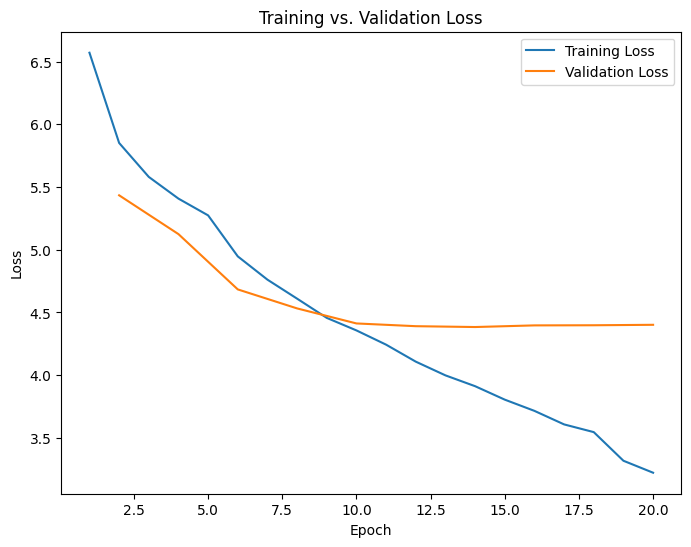

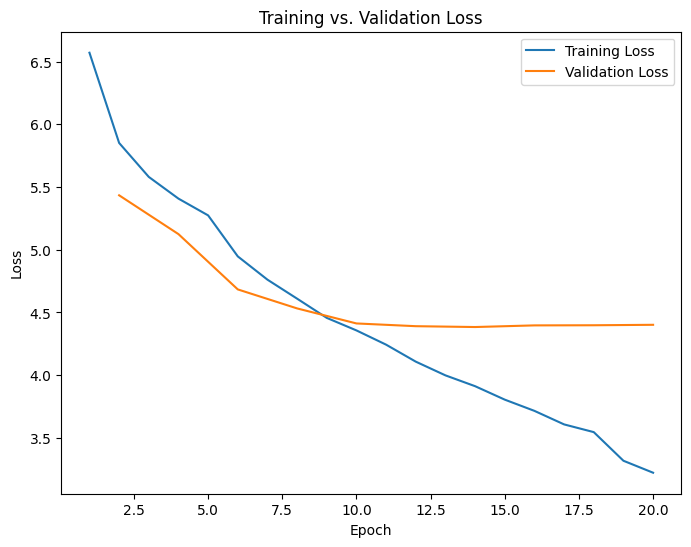

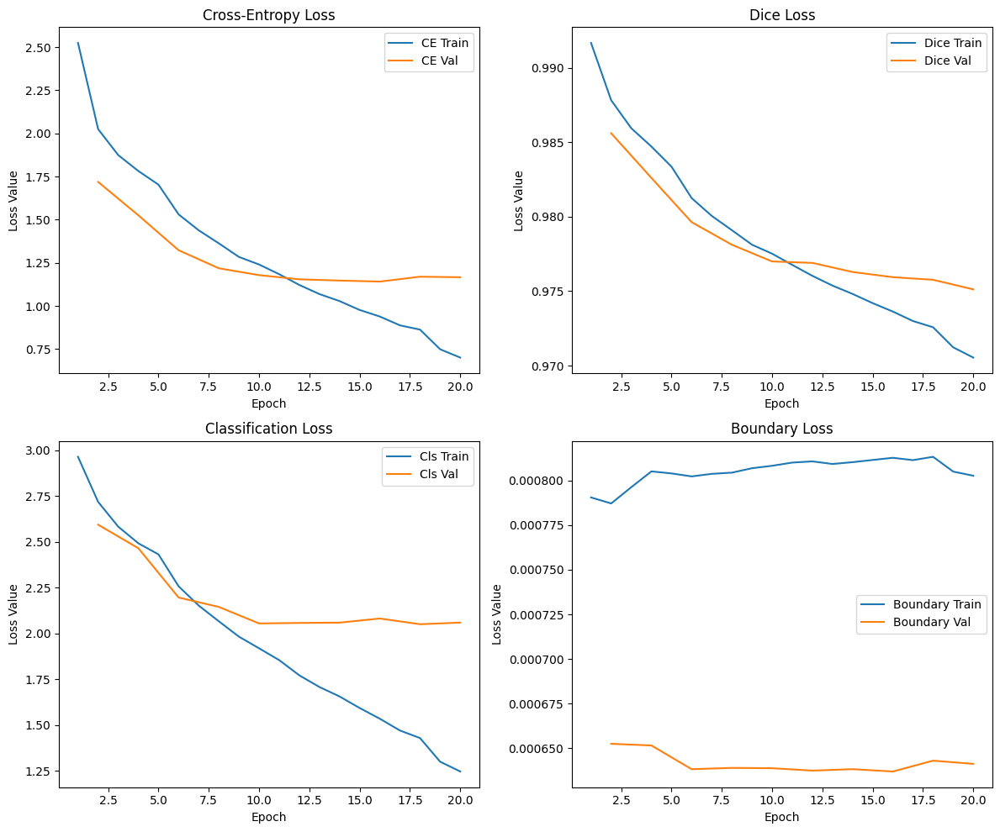

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

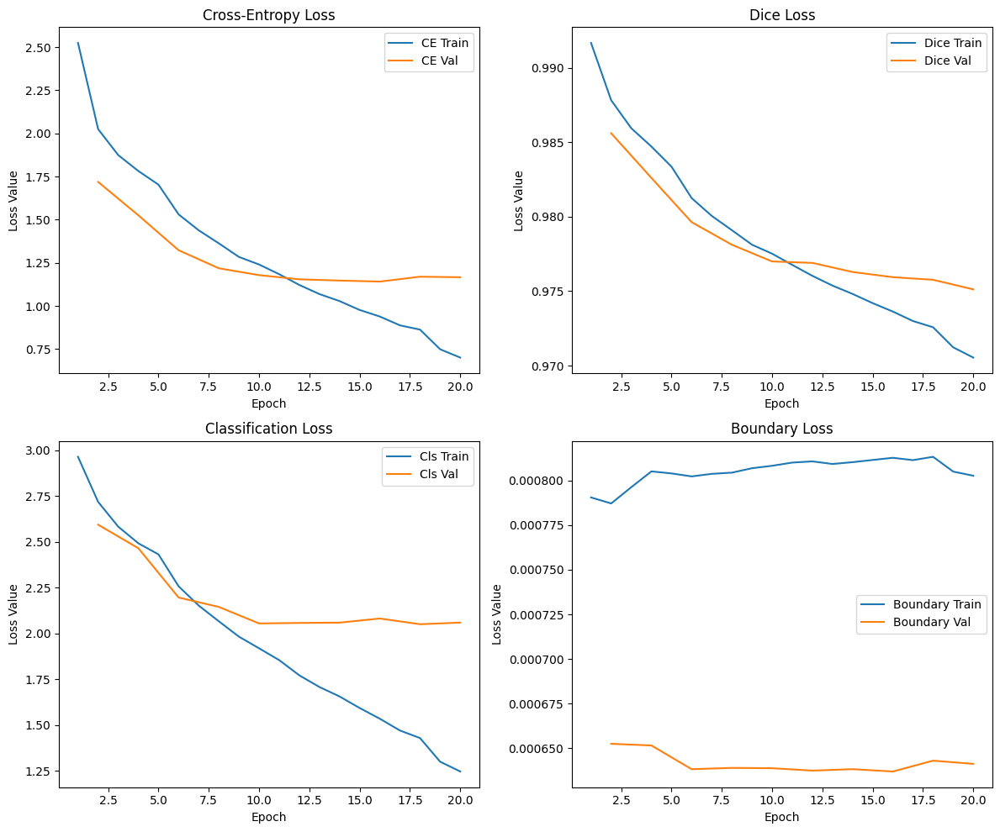

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# Hyperparameters (Updated from BO)
OPT_HYPERPARAMS = {
    "img_scale": 1.0,
    "batch_size": 6,
    "num_epochs": 20,
    "learning_rate": 1.52e-4,
    "weight_decay": 1.07e-5,
    "num_workers": 4,
    "num_classes": 104,
    "use_amp": True,
    "flip_prob": 0.5,
    "rotation_degrees": 15,
    "dice_weight": 1.478,
    "cls_loss_weight": 0.8709,
    "unfreeze_frac": 0.5,
    "boundary_loss_weight": 0.15,
    "dropout_rate": 0.3,
    "color_jitter_brightness": 0.2,
    "color_jitter_contrast": 0.2,
    "color_jitter_saturation": 0.2,
    "color_jitter_hue": 0.1
}

base_size = 513
OPT_HYPERPARAMS["img_size"] = (
    int(round(base_size * OPT_HYPERPARAMS["img_scale"])),
    int(round(base_size * OPT_HYPERPARAMS["img_scale"]))
)

print("Using Hyperparameters:")
for key, value in OPT_HYPERPARAMS.items():
    print(f"  {key}: {value}")

# Computes pixel accuracy, IoU and Dice from confusion matrix
def compute_metrics_from_confusion(conf_matrix):
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list = []
    dice_list = []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - conf_matrix[i, i]
        if union == 0:
            iou, dice = np.nan, np.nan
        else:
            iou = intersection / union
            s = np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i])
            dice = np.nan if s == 0 else (2 * intersection) / (s + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

# Dice loss function
def dice_loss_fn(pred, target, smooth=1e-6):
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1])\
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

# Vectorized classification loss (KL divergence)
def vectorized_classification_loss_fn(outputs, masks, num_classes):
    p_pred = torch.softmax(outputs, dim=1).mean(dim=[2,3])
    p_pred = p_pred[:, 1:]  # Exclude background
    one_hot_masks = torch.nn.functional.one_hot(masks, num_classes=num_classes)
    counts = one_hot_masks.sum(dim=(1,2)).float()
    target_presence = (counts[:, 1:] > 0).float()
    sums = target_presence.sum(dim=1, keepdim=True)
    target_distribution = target_presence / (sums + 1e-8)
    loss_cls = nn.functional.kl_div(p_pred.log(), target_distribution, reduction='batchmean')
    return loss_cls

# Boundary loss using a Laplacian kernel
def vectorized_boundary_loss_fn(pred, target):
    pred = torch.softmax(pred, dim=1)
    N, C, H, W = pred.shape
    laplacian_kernel = torch.tensor([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]], dtype=pred.dtype, device=pred.device)
    laplacian_kernel = laplacian_kernel.view(1, 1, 3, 3).repeat(C, 1, 1, 1)
    boundaries_pred = torch.abs(torch.nn.functional.conv2d(pred, laplacian_kernel, padding=1, groups=C))

    target_one_hot = torch.nn.functional.one_hot(target, num_classes=C)\
                          .permute(0, 3, 1, 2).float().to(pred.device)
    boundaries_target = torch.abs(torch.nn.functional.conv2d(target_one_hot, laplacian_kernel, padding=1, groups=C))

    loss_boundary = torch.nn.functional.l1_loss(boundaries_pred, boundaries_target)
    return loss_boundary

# Dataset for food segmentation
class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_transform=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_transform = mask_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))

        # Apply joint geometric transforms
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)

        if self.mask_transform:
            mask = self.mask_transform(mask)
        if self.img_transform:
            img = self.img_transform(img)

        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask

# Joint transform that applies random resized crop, horizontal flip, and rotation
class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=15, random_crop=True, crop_scale=(0.8, 1.0), crop_size=None):
        """
        Args:
            flip_prob (float): Probability of applying horizontal flip.
            rotation_degrees (float): Maximum degrees for random rotation.
            random_crop (bool): Whether to apply a random resized crop.
            crop_scale (tuple): The scale range for the random crop.
            crop_size (tuple): The desired output size (width, height) of the crop.
        """
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees
        self.random_crop = random_crop
        self.crop_scale = crop_scale
        self.crop_size = crop_size

    def __call__(self, img, mask):
        if self.random_crop and self.crop_size is not None:
            i, j, h, w = transforms.RandomResizedCrop.get_params(img, scale=self.crop_scale, ratio=(3/4, 4/3))
            img = transforms.functional.resized_crop(img, i, j, h, w, self.crop_size, interpolation=Image.BILINEAR)
            mask = transforms.functional.resized_crop(mask, i, j, h, w, self.crop_size, interpolation=Image.NEAREST)

        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)

        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            # Set expand=False to keep the size consistent
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR, expand=False)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST, expand=False)

        return img, mask

# Data Preparation
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, test_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Testing set shape:", test_df.shape)

# Define Transforms
train_img_transform = transforms.Compose([
    transforms.ColorJitter(
        brightness=OPT_HYPERPARAMS["color_jitter_brightness"],
        contrast=OPT_HYPERPARAMS["color_jitter_contrast"],
        saturation=OPT_HYPERPARAMS["color_jitter_saturation"],
        hue=OPT_HYPERPARAMS["color_jitter_hue"]
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
val_img_transform = transforms.Compose([
    transforms.Resize(OPT_HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
mask_transform = transforms.Resize(OPT_HYPERPARAMS["img_size"], interpolation=Image.NEAREST)

train_joint_transform = JointTransform(
    flip_prob=OPT_HYPERPARAMS["flip_prob"],
    rotation_degrees=OPT_HYPERPARAMS["rotation_degrees"],
    random_crop=True,
    crop_scale=(0.8, 1.0),
    crop_size=OPT_HYPERPARAMS["img_size"]
)

train_dataset = FoodSegDataset(train_df,
                               img_transform=train_img_transform,
                               mask_transform=mask_transform,
                               joint_transform=train_joint_transform)
train_loader = DataLoader(train_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                          shuffle=True, num_workers=OPT_HYPERPARAMS["num_workers"])

test_dataset = FoodSegDataset(test_df,
                              img_transform=val_img_transform,
                              mask_transform=mask_transform,
                              joint_transform=None)
test_loader = DataLoader(test_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                         shuffle=False, num_workers=OPT_HYPERPARAMS["num_workers"])

# Build Model
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
# Freeze entire backbone initially.
for param in model.backbone.parameters():
    param.requires_grad = False

# Set up gradual unfreezing.
backbone_children = list(model.backbone.children())
n_children = len(backbone_children)
target_unfreeze = int(OPT_HYPERPARAMS["unfreeze_frac"] * n_children)
current_unfrozen = 0  # How many backbone child modules have been unfrozen so far.

# Insert dropout into classifier
if isinstance(model.classifier, nn.Sequential):
    classifier_layers = list(model.classifier.children())
    classifier_layers.insert(-1, nn.Dropout(OPT_HYPERPARAMS["dropout_rate"]))
    classifier_layers[-1] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)
    model.classifier = nn.Sequential(*classifier_layers)
else:
    model.classifier[4] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Loss, Optimizer, Scheduler, and AMP Scaler
criterion_ce = nn.CrossEntropyLoss()
dice_weight = OPT_HYPERPARAMS["dice_weight"]
cls_loss_weight = OPT_HYPERPARAMS["cls_loss_weight"]
boundary_loss_weight = OPT_HYPERPARAMS["boundary_loss_weight"]

optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                       lr=OPT_HYPERPARAMS["learning_rate"],
                       weight_decay=OPT_HYPERPARAMS["weight_decay"])
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
scaler = torch.cuda.amp.GradScaler() if OPT_HYPERPARAMS["use_amp"] and device.type == 'cuda' else None

# Training & Validation Loop
train_losses = []
val_losses = []
best_val_loss = float('inf')
model_save_path = "/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth"

# Logs for individual loss components
train_loss_ce_log = []
train_loss_dice_log = []
train_loss_cls_log = []
train_loss_bound_log = []

val_loss_ce_log = []
val_loss_dice_log = []
val_loss_cls_log = []
val_loss_bound_log = []

num_epochs = OPT_HYPERPARAMS["num_epochs"]
validate_every = 2  # Run validation every 2 epochs

for epoch in range(num_epochs):
    # Gradual unfreezing
    allowed_unfreeze = int(((epoch + 1) / num_epochs) * target_unfreeze)
    if allowed_unfreeze > current_unfrozen:
        new_layers = backbone_children[-(allowed_unfreeze - current_unfrozen):]
        new_params = []
        for child in new_layers:
            for param in child.parameters():
                if not param.requires_grad:
                    param.requires_grad = True
                    new_params.append(param)
        if new_params:
            optimizer.add_param_group({
                'params': new_params,
                'lr': OPT_HYPERPARAMS["learning_rate"],
                'weight_decay': OPT_HYPERPARAMS["weight_decay"]
            })
            scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
        current_unfrozen = allowed_unfreeze
        print(f"Epoch {epoch+1}: Unfroze {allowed_unfreeze} out of {n_children} backbone layers.")

    model.train()
    train_loss_total = 0.0
    train_loss_ce_epoch = 0.0
    train_loss_dice_epoch = 0.0
    train_loss_cls_epoch = 0.0
    train_loss_bound_epoch = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]")
    for images, masks in train_bar:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        if scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)['out']
                loss_ce_val = criterion_ce(outputs, masks)
                loss_dice_val = dice_loss_fn(outputs, masks)
                loss_cls_val = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
                loss_bound_val = vectorized_boundary_loss_fn(outputs, masks)
                loss = (loss_ce_val +
                        dice_weight * loss_dice_val +
                        cls_loss_weight * loss_cls_val +
                        boundary_loss_weight * loss_bound_val)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)['out']
            loss_ce_val = criterion_ce(outputs, masks)
            loss_dice_val = dice_loss_fn(outputs, masks)
            loss_cls_val = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
            loss_bound_val = vectorized_boundary_loss_fn(outputs, masks)
            loss = (loss_ce_val +
                    dice_weight * loss_dice_val +
                    cls_loss_weight * loss_cls_val +
                    boundary_loss_weight * loss_bound_val)
            loss.backward()
            optimizer.step()

        train_loss_total += loss.item()
        train_loss_ce_epoch += loss_ce_val.item()
        train_loss_dice_epoch += loss_dice_val.item()
        train_loss_cls_epoch += loss_cls_val.item()
        train_loss_bound_epoch += loss_bound_val.item()

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = train_loss_total / len(train_loader)
    train_losses.append(avg_train_loss)
    train_loss_ce_log.append(train_loss_ce_epoch / len(train_loader))
    train_loss_dice_log.append(train_loss_dice_epoch / len(train_loader))
    train_loss_cls_log.append(train_loss_cls_epoch / len(train_loader))
    train_loss_bound_log.append(train_loss_bound_epoch / len(train_loader))

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}")

    # Validation
    if (epoch + 1) % validate_every == 0:
        model.eval()
        test_loss_total = 0.0
        test_loss_ce_epoch = 0.0
        test_loss_dice_epoch = 0.0
        test_loss_cls_epoch = 0.0
        test_loss_bound_epoch = 0.0

        test_conf_matrix = np.zeros((OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"]), dtype=np.int64)
        with torch.no_grad():
            test_bar = tqdm(test_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Testing]")
            for images, masks in test_bar:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)['out']
                loss_ce_val = criterion_ce(outputs, masks)
                loss_dice_val = dice_loss_fn(outputs, masks)
                loss_cls_val = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
                loss_bound_val = vectorized_boundary_loss_fn(outputs, masks)
                loss = (loss_ce_val +
                        dice_weight * loss_dice_val +
                        cls_loss_weight * loss_cls_val +
                        boundary_loss_weight * loss_bound_val)
                test_loss_total += loss.item()
                test_loss_ce_epoch += loss_ce_val.item()
                test_loss_dice_epoch += loss_dice_val.item()
                test_loss_cls_epoch += loss_cls_val.item()
                test_loss_bound_epoch += loss_bound_val.item()

                preds = outputs.argmax(dim=1).detach().cpu().numpy()
                targets = masks.detach().cpu().numpy()
                batch_conf = np.bincount(
                    OPT_HYPERPARAMS["num_classes"] * targets.flatten() + preds.flatten(),
                    minlength=OPT_HYPERPARAMS["num_classes"]**2
                ).reshape(OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"])
                test_conf_matrix += batch_conf

                test_bar.set_postfix(loss=f"{loss.item():.4f}")

        avg_test_loss = test_loss_total / len(test_loader)
        val_losses.append(avg_test_loss)
        val_loss_ce_log.append(test_loss_ce_epoch / len(test_loader))
        val_loss_dice_log.append(test_loss_dice_epoch / len(test_loader))
        val_loss_cls_log.append(test_loss_cls_epoch / len(test_loader))
        val_loss_bound_log.append(test_loss_bound_epoch / len(test_loader))

        test_pixel_acc, test_mean_iou, test_mean_dice = compute_metrics_from_confusion(test_conf_matrix)
        print(f"Epoch [{epoch+1}/{num_epochs}], Val Loss: {avg_test_loss:.4f}, "
              f"Pixel Acc: {test_pixel_acc:.4f}, mIoU: {test_mean_iou:.4f}, mDice: {test_mean_dice:.4f}")

        scheduler.step(avg_test_loss)

        if avg_test_loss < best_val_loss:
            best_val_loss = avg_test_loss
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'scaler_state_dict': scaler.state_dict() if scaler is not None else None,
                'best_val_loss': best_val_loss
            }
            torch.save(checkpoint, model_save_path)
            print(f"New best model found and checkpoint saved with Val Loss: {avg_test_loss:.4f}")

# Plot Overall Loss Curves
plt.figure(figsize=(8, 6))
plt.plot(range(1, num_epochs+1), train_losses, label="Training Loss")
val_x = list(range(validate_every, num_epochs+1, validate_every))
plt.plot(val_x, val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss")
plt.legend()
plt.show()

# Plot Individual Loss Components
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
epochs_range = range(1, num_epochs+1)

axs[0, 0].plot(epochs_range, train_loss_ce_log, label="CE Train")
val_ce_x = range(validate_every, num_epochs+1, validate_every)
axs[0, 0].plot(val_ce_x, val_loss_ce_log, label="CE Val")
axs[0, 0].set_title("Cross-Entropy Loss")
axs[0, 0].legend()
axs[0, 0].set_xlabel("Epoch")
axs[0, 0].set_ylabel("Loss Value")

axs[0, 1].plot(epochs_range, train_loss_dice_log, label="Dice Train")
val_dice_x = range(validate_every, num_epochs+1, validate_every)
axs[0, 1].plot(val_dice_x, val_loss_dice_log, label="Dice Val")
axs[0, 1].set_title("Dice Loss")
axs[0, 1].legend()
axs[0, 1].set_xlabel("Epoch")
axs[0, 1].set_ylabel("Loss Value")

axs[1, 0].plot(epochs_range, train_loss_cls_log, label="Cls Train")
val_cls_x = range(validate_every, num_epochs+1, validate_every)
axs[1, 0].plot(val_cls_x, val_loss_cls_log, label="Cls Val")
axs[1, 0].set_title("Classification Loss")
axs[1, 0].legend()
axs[1, 0].set_xlabel("Epoch")
axs[1, 0].set_ylabel("Loss Value")

axs[1, 1].plot(epochs_range, train_loss_bound_log, label="Boundary Train")
val_bound_x = range(validate_every, num_epochs+1, validate_every)
axs[1, 1].plot(val_bound_x, val_loss_bound_log, label="Boundary Val")
axs[1, 1].set_title("Boundary Loss")
axs[1, 1].legend()
axs[1, 1].set_xlabel("Epoch")
axs[1, 1].set_ylabel("Loss Value")

plt.tight_layout()
plt.show()

from google.colab import files
files.download("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth")


<ipython-input-11-7d632bf137ff>:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Resuming training from epoch 14


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
<ipython-input-11-7d632bf137ff>:59: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if OPT_HYPERPARAMS["use_amp"] and device.type == 'cuda' else None


Skipping loading optimizer state dict due to parameter group mismatch.
Set new learning rate to 1e-05 for resumed training.
Currently unfrozen backbone layers: 0 out of 8
Epoch 15: Gradually unfreezing; now 3 out of 8 backbone layers trainable.


Epoch 15/40 [Training]:   0%|          | 0/665 [00:00<?, ?it/s]<ipython-input-11-7d632bf137ff>:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast() if scaler is not None else torch.no_grad():
Epoch 15/40 [Training]: 100%|██████████| 665/665 [13:54<00:00,  1.25s/it]


Epoch [15/40], Train Loss: 3.6672


Epoch 16/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [16/40], Train Loss: 3.5424


Epoch 16/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [16/40], Val Loss: 4.2163, Pixel Acc: 0.7235, mIoU: 0.2273, mDice: 0.3190
New best model saved with Val Loss: 4.2163


Epoch 17/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [17/40], Train Loss: 3.4882


Epoch 18/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [18/40], Train Loss: 3.4477


Epoch 18/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [18/40], Val Loss: 4.2247, Pixel Acc: 0.7240, mIoU: 0.2338, mDice: 0.3274


Epoch 19/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [19/40], Train Loss: 3.4006
Epoch 20: Gradually unfreezing; now 4 out of 8 backbone layers trainable.


Epoch 20/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [20/40], Train Loss: 3.3578


Epoch 20/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [20/40], Val Loss: 4.2279, Pixel Acc: 0.7278, mIoU: 0.2351, mDice: 0.3294


Epoch 21/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [21/40], Train Loss: 3.3115


Epoch 22/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [22/40], Train Loss: 3.2902


Epoch 22/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [22/40], Val Loss: 4.2197, Pixel Acc: 0.7297, mIoU: 0.2356, mDice: 0.3295


Epoch 23/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [23/40], Train Loss: 3.2763


Epoch 24/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [24/40], Train Loss: 3.2527


Epoch 24/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [24/40], Val Loss: 4.2138, Pixel Acc: 0.7275, mIoU: 0.2378, mDice: 0.3328
New best model saved with Val Loss: 4.2138
Epoch 25: Gradually unfreezing; now 5 out of 8 backbone layers trainable.


Epoch 25/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [25/40], Train Loss: 3.2417


Epoch 26/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [26/40], Train Loss: 3.2324


Epoch 26/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [26/40], Val Loss: 4.2258, Pixel Acc: 0.7292, mIoU: 0.2361, mDice: 0.3301


Epoch 27/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [27/40], Train Loss: 3.2030


Epoch 28/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [28/40], Train Loss: 3.2010


Epoch 28/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [28/40], Val Loss: 4.2222, Pixel Acc: 0.7286, mIoU: 0.2395, mDice: 0.3350


Epoch 29/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [29/40], Train Loss: 3.1785
Epoch 30: Gradually unfreezing; now 6 out of 8 backbone layers trainable.


Epoch 30/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [30/40], Train Loss: 3.1671


Epoch 30/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [30/40], Val Loss: 4.2323, Pixel Acc: 0.7304, mIoU: 0.2415, mDice: 0.3375


Epoch 31/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [31/40], Train Loss: 3.1613


Epoch 32/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [32/40], Train Loss: 3.1588


Epoch 32/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [32/40], Val Loss: 4.2353, Pixel Acc: 0.7304, mIoU: 0.2395, mDice: 0.3342


Epoch 33/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [33/40], Train Loss: 3.1393


Epoch 34/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [34/40], Train Loss: 3.1335


Epoch 34/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [34/40], Val Loss: 4.2472, Pixel Acc: 0.7283, mIoU: 0.2389, mDice: 0.3342
Epoch 35: Gradually unfreezing; now 7 out of 8 backbone layers trainable.


Epoch 35/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [35/40], Train Loss: 3.1261


Epoch 36/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [36/40], Train Loss: 3.1246


Epoch 36/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [36/40], Val Loss: 4.2312, Pixel Acc: 0.7289, mIoU: 0.2403, mDice: 0.3359


Epoch 37/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [37/40], Train Loss: 3.1098


Epoch 38/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [38/40], Train Loss: 3.1209


Epoch 38/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]


Epoch [38/40], Val Loss: 4.2442, Pixel Acc: 0.7305, mIoU: 0.2422, mDice: 0.3386


Epoch 39/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [39/40], Train Loss: 3.1203
Epoch 40: Gradually unfreezing; now 8 out of 8 backbone layers trainable.


Epoch 40/40 [Training]: 100%|██████████| 665/665 [13:53<00:00,  1.25s/it]


Epoch [40/40], Train Loss: 3.1156


Epoch 40/40 [Validation]: 100%|██████████| 167/167 [02:35<00:00,  1.07it/s]

Epoch [40/40], Val Loss: 4.2301, Pixel Acc: 0.7305, mIoU: 0.2396, mDice: 0.3356


ValueError: x and y must have same first dimension, but have shapes (27,) and (26,)

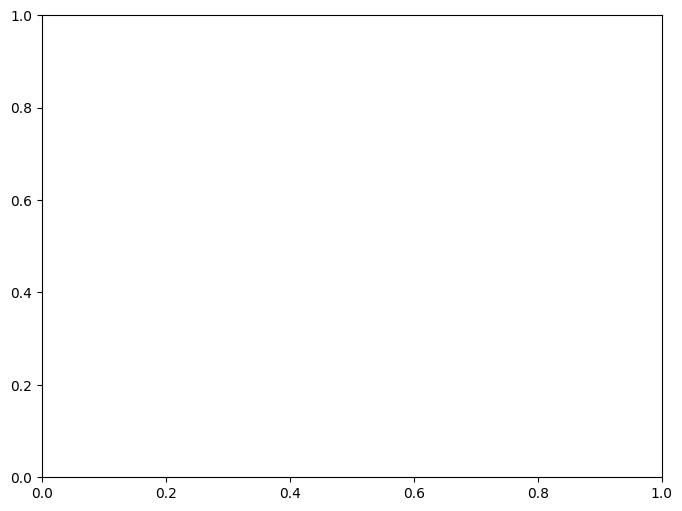

In [ ]:
# Code for loading from checkpoint changed a few hyperparemeters from initial training set up in an attempt to slow overfitting
# as a result optimizer and scheduler need to be reinitilaized leading to lower initial results


import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Updated hyperparameters from training
OPT_HYPERPARAMS["unfreeze_frac"] = 1.0
OPT_HYPERPARAMS["dropout_rate"] = 0.5
new_total_epochs = 40
new_lr = 1e-5

# Load the checkpoint
checkpoint_path = "/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth"
checkpoint = torch.load(checkpoint_path)
start_epoch = checkpoint['epoch'] + 1
print(f"Resuming training from epoch {start_epoch}")

# Re-create the model
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
# Freeze the entire backbone initially; gradual unfreezing will re-enable training for layers.
for param in model.backbone.parameters():
    param.requires_grad = False

# Update the classifier to use the new dropout rate
if isinstance(model.classifier, nn.Sequential):
    classifier_layers = list(model.classifier.children())
    classifier_layers = [layer for layer in classifier_layers if not isinstance(layer, nn.Dropout)]
    classifier_layers.insert(-1, nn.Dropout(OPT_HYPERPARAMS["dropout_rate"]))
    classifier_layers[-1] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)
    model.classifier = nn.Sequential(*classifier_layers)
else:
    model.classifier[4] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.load_state_dict(checkpoint['model_state_dict'])

# Reinitialize the optimizer and scheduler
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                       lr=OPT_HYPERPARAMS["learning_rate"],
                       weight_decay=OPT_HYPERPARAMS["weight_decay"])
print("Skipping loading optimizer state dict due to parameter group mismatch.")

for g in optimizer.param_groups:
    g['lr'] = new_lr
print(f"Set new learning rate to {new_lr} for resumed training.")

scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
scaler = torch.cuda.amp.GradScaler() if OPT_HYPERPARAMS["use_amp"] and device.type == 'cuda' else None

# Reset gradual unfreezing variables
backbone_children = list(model.backbone.children())
n_children = len(backbone_children)
target_unfreeze = int(OPT_HYPERPARAMS["unfreeze_frac"] * n_children)  # Now full backbone
# Count how many backbone groups are currently trainable.
current_unfrozen = sum(1 for child in backbone_children if any(p.requires_grad for p in child.parameters()))
print(f"Currently unfrozen backbone layers: {current_unfrozen} out of {n_children}")



# Resume Training
train_losses = []
val_losses = []
best_val_loss = checkpoint.get('best_val_loss', float('inf'))

for epoch in range(start_epoch, new_total_epochs):
    # Gradual unfreezing
    allowed_unfreeze = int(((epoch + 1) / new_total_epochs) * target_unfreeze)
    if allowed_unfreeze > current_unfrozen:
        new_layers = backbone_children[-(allowed_unfreeze - current_unfrozen):]
        new_params = []
        for child in new_layers:
            for param in child.parameters():
                if not param.requires_grad:
                    param.requires_grad = True
                    new_params.append(param)
        if new_params:
            optimizer.add_param_group({
                'params': new_params,
                'lr': new_lr,
                'weight_decay': OPT_HYPERPARAMS["weight_decay"]
            })
            # Reinitialize scheduler so it now sees all parameter groups.
            scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
        current_unfrozen = allowed_unfreeze
        print(f"Epoch {epoch+1}: Gradually unfreezing; now {current_unfrozen} out of {n_children} backbone layers trainable.")

    model.train()
    train_loss_total = 0.0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{new_total_epochs} [Training]"):
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast() if scaler is not None else torch.no_grad():
            outputs = model(images)['out']
            loss_ce = nn.CrossEntropyLoss()(outputs, masks)
            loss_dice = dice_loss_fn(outputs, masks)
            loss_cls = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
            loss_bound = vectorized_boundary_loss_fn(outputs, masks)
            loss = loss_ce + OPT_HYPERPARAMS["dice_weight"] * loss_dice + \
                   OPT_HYPERPARAMS["cls_loss_weight"] * loss_cls + \
                   OPT_HYPERPARAMS["boundary_loss_weight"] * loss_bound
        if scaler is not None:
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            optimizer.step()
        train_loss_total += loss.item()
    avg_train_loss = train_loss_total / len(train_loader)
    train_losses.append(avg_train_loss)
    print(f"Epoch [{epoch+1}/{new_total_epochs}], Train Loss: {avg_train_loss:.4f}")

    # Validation every 2 epochs.
    if (epoch + 1) % 2 == 0:
        model.eval()
        val_loss_total = 0.0
        test_conf_matrix = np.zeros((OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"]), dtype=np.int64)
        with torch.no_grad():
            for images, masks in tqdm(test_loader, desc=f"Epoch {epoch+1}/{new_total_epochs} [Validation]"):
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)['out']
                loss_ce = nn.CrossEntropyLoss()(outputs, masks)
                loss_dice = dice_loss_fn(outputs, masks)
                loss_cls = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
                loss_bound = vectorized_boundary_loss_fn(outputs, masks)
                loss = loss_ce + OPT_HYPERPARAMS["dice_weight"] * loss_dice + \
                       OPT_HYPERPARAMS["cls_loss_weight"] * loss_cls + \
                       OPT_HYPERPARAMS["boundary_loss_weight"] * loss_bound
                val_loss_total += loss.item()
                preds = outputs.argmax(dim=1).detach().cpu().numpy()
                targets = masks.detach().cpu().numpy()
                batch_conf = np.bincount(
                    OPT_HYPERPARAMS["num_classes"] * targets.flatten() + preds.flatten(),
                    minlength=OPT_HYPERPARAMS["num_classes"]**2
                ).reshape(OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"])
                test_conf_matrix += batch_conf
        avg_val_loss = val_loss_total / len(test_loader)
        val_losses.append(avg_val_loss)
        pixel_acc, mIoU, mDice = compute_metrics_from_confusion(test_conf_matrix)
        print(f"Epoch [{epoch+1}/{new_total_epochs}], Val Loss: {avg_val_loss:.4f}, "
              f"Pixel Acc: {pixel_acc:.4f}, mIoU: {mIoU:.4f}, mDice: {mDice:.4f}")
        scheduler.step(avg_val_loss)
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'scaler_state_dict': scaler.state_dict() if scaler is not None else None,
                'best_val_loss': best_val_loss
            }
            torch.save(checkpoint, checkpoint_path)
            print(f"New best model saved with Val Loss: {avg_val_loss:.4f}")

from google.colab import files
files.download("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth")

# Plot the loss curves.
plt.figure(figsize=(8, 6))
plt.plot(range(start_epoch, new_total_epochs+1), train_losses, label="Train Loss")
val_epochs = list(range(start_epoch + (2 - start_epoch % 2), new_total_epochs+1, 2))
plt.plot(val_epochs, val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Resumed Training Loss Curves")
plt.legend()
plt.show()




In [ ]:
# Downloads current best performing checkpoint

from google.colab import files
files.download("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Necessary install for CRF refinement

!pip install git+https://github.com/lucasb-eyer/pydensecrf.git


  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-jpxv992y
  Running command git clone --filter=blob:none --quiet https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-jpxv992y
  Resolved https://github.com/lucasb-eyer/pydensecrf.git to commit 2723c7fa4f2ead16ae1ce3d8afe977724bb8f87f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0-cp311-cp311-linux_x86_64.whl size=3440302 sha256=7e490666a0379eda99c35c0e7040ceda5ba82cbcc0b8d7eae3ef7b3f70b404e7
  Stored in directory: /tmp/pip-ephem-wheel-cache-nnaf2v04/wheels/ce/8e/34/6dcfa200a9e2ae3627d8009b8bd1ca9b24512bec50a93304de
Successfully built pydensecrf


The main changes of this expierment happen here in the validation code. I have added post processing to help deal with the over prediction and over segmentting problems. This change shows very promising results, at the minute the post processing is too agressive and tends to merge items that should not be merged but I have chosen to leave that as is for now and to wait until we have a better performing model before refining the postprocessing

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-9-21ab332eacbb>:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickli

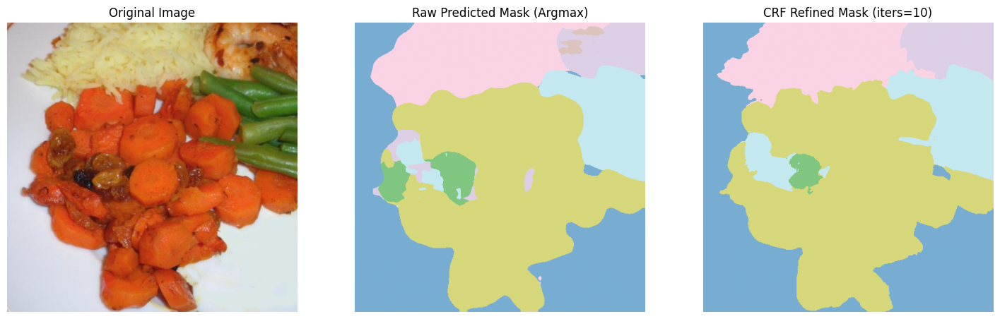

True food items:       ['French beans', 'rice', 'dried cranberries', 'carrot', 'shrimp']
Predicted food items:  ['French beans', 'rice', 'white button mushroom', 'chicken duck', 'carrot', 'soy']
Food Accuracy:        37.50%
Pixel Accuracy:       88.37%
Mean IoU:             56.01%
Mean Dice:            57.94%
Avg. Hausdorff Dist.: 26.07 pixels



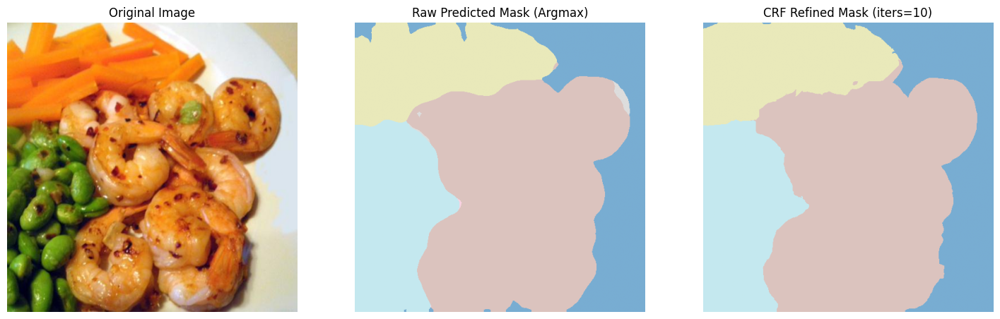

True food items:       ['shrimp', 'carrot', 'green beans']
Predicted food items:  ['shrimp', 'carrot', 'green beans']
Food Accuracy:        100.00%
Pixel Accuracy:       95.53%
Mean IoU:             91.77%
Mean Dice:            95.60%
Avg. Hausdorff Dist.: 29.48 pixels



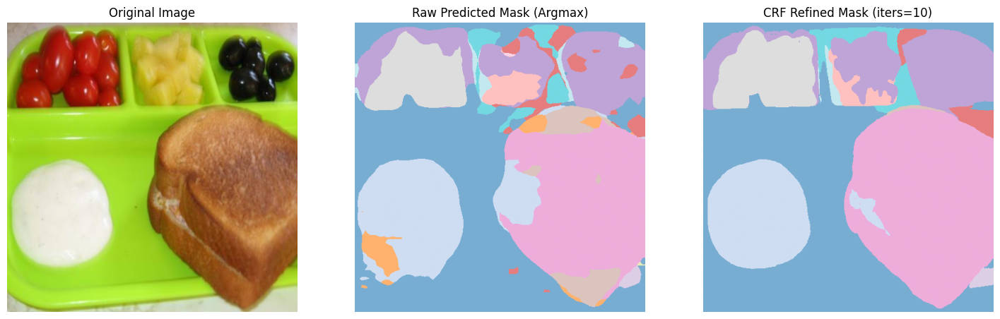

True food items:       ['olives', 'pineapple', 'tomato', 'sauce', 'bread']
Predicted food items:  ['mango', 'ice cream', 'pineapple', 'grape', 'tomato', 'orange', 'sauce', 'celery stick', 'bread', 'banana', 'pepper']
Food Accuracy:        33.33%
Pixel Accuracy:       72.38%
Mean IoU:             50.56%
Mean Dice:            54.63%
Avg. Hausdorff Dist.: 109.84 pixels



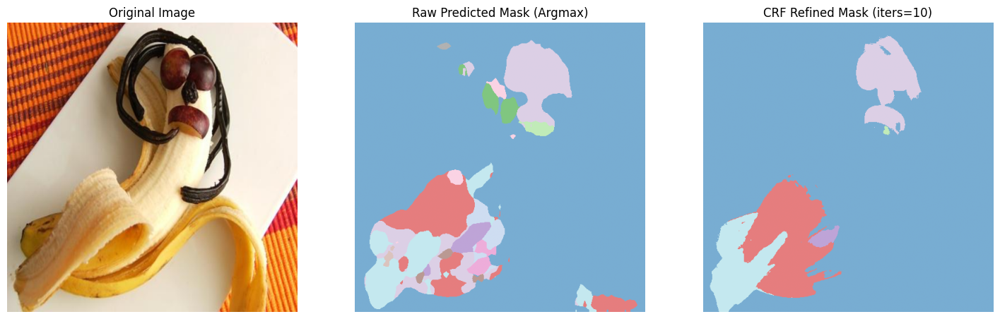

True food items:       ['grape', 'chocolate', 'banana']
Predicted food items:  ['peach', 'grape', 'pumpkin', 'carrot', 'apple', 'banana']
Food Accuracy:        28.57%
Pixel Accuracy:       69.12%
Mean IoU:             30.05%
Mean Dice:            39.44%
Avg. Hausdorff Dist.: 130.16 pixels



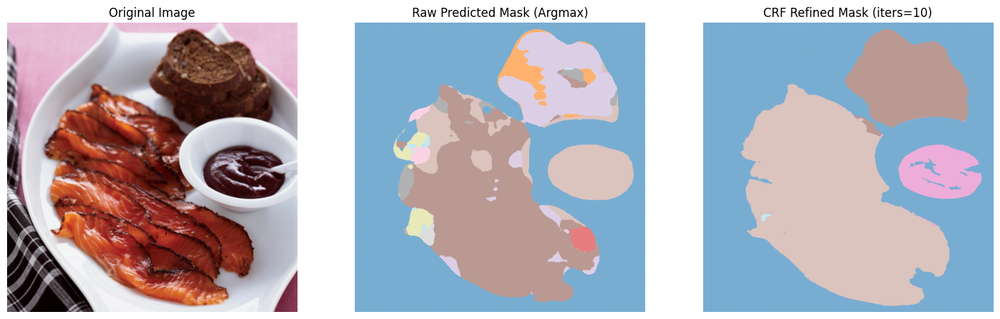

True food items:       ['bread', 'sauce', 'fish']
Predicted food items:  ['sauce', 'carrot', 'steak', 'pork']
Food Accuracy:        16.67%
Pixel Accuracy:       56.76%
Mean IoU:             29.43%
Mean Dice:            31.26%
Avg. Hausdorff Dist.: 61.00 pixels



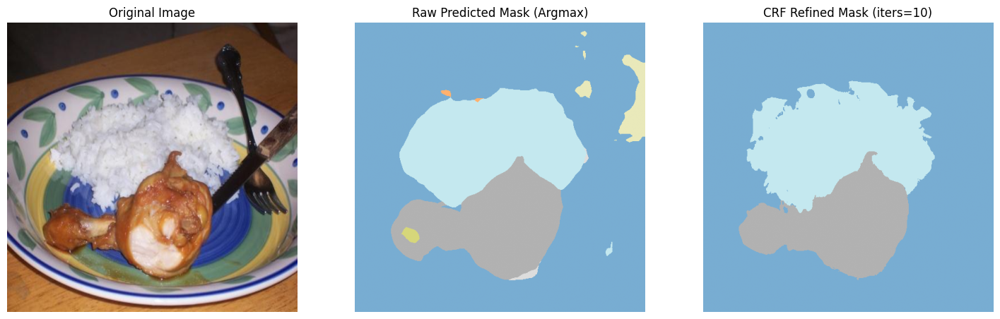

True food items:       ['chicken duck', 'rice']
Predicted food items:  ['chicken duck', 'rice']
Food Accuracy:        100.00%
Pixel Accuracy:       95.80%
Mean IoU:             87.93%
Mean Dice:            93.45%
Avg. Hausdorff Dist.: 27.06 pixels



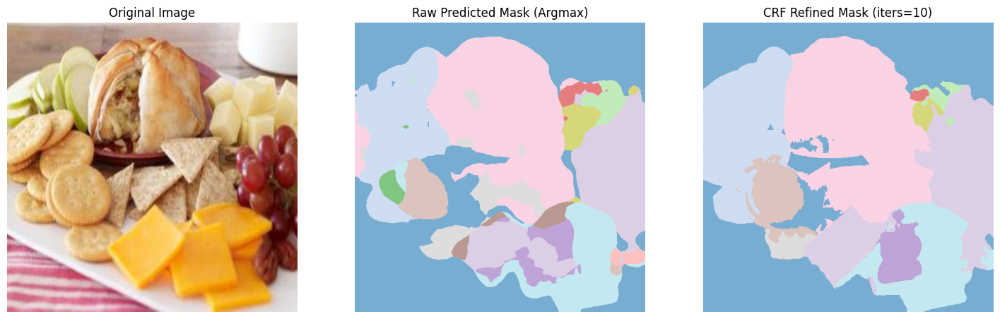

True food items:       ['biscuit', 'other ingredients', 'cheese butter', 'grape', 'apple', 'bread']
Predicted food items:  ['mango', 'french fries', 'pie', 'biscuit', 'potato', 'pineapple', 'grape', 'sausage', 'carrot', 'apple', 'bread', 'banana']
Food Accuracy:        28.57%
Pixel Accuracy:       55.76%
Mean IoU:             23.98%
Mean Dice:            31.57%
Avg. Hausdorff Dist.: 218.26 pixels



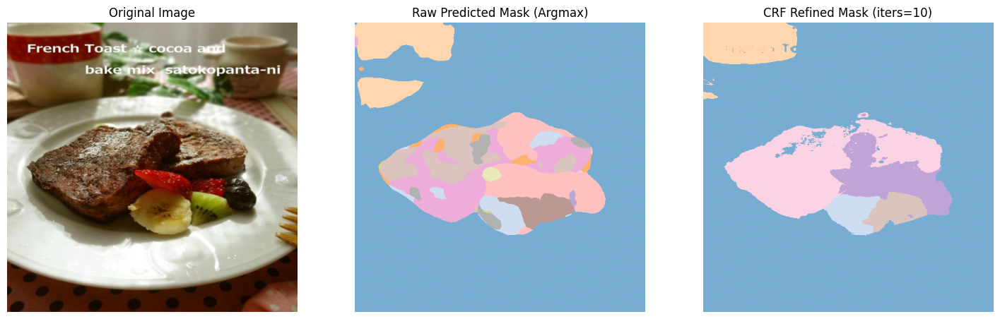

True food items:       ['blueberry', 'kiwi', 'bread', 'banana', 'strawberry']
Predicted food items:  ['blueberry', 'biscuit', 'tomato', 'kiwi', 'coffee', 'chicken duck', 'fried meat', 'strawberry', 'cherry']
Food Accuracy:        27.27%
Pixel Accuracy:       76.88%
Mean IoU:             43.15%
Mean Dice:            50.07%
Avg. Hausdorff Dist.: 31.58 pixels



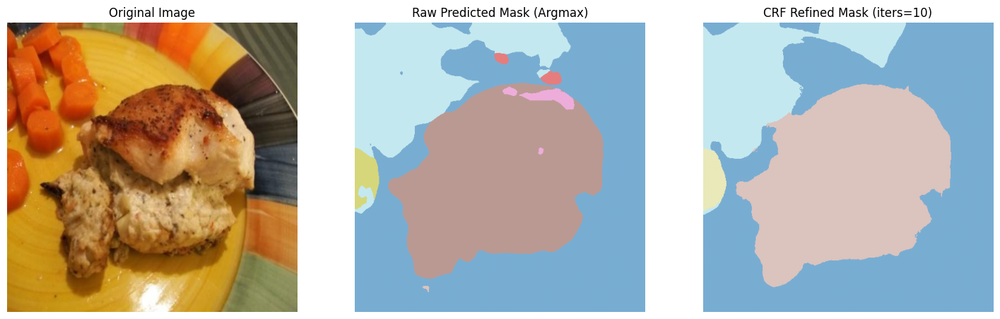

True food items:       ['chicken duck', 'carrot']
Predicted food items:  ['chicken duck', 'tomato', 'carrot']
Food Accuracy:        66.67%
Pixel Accuracy:       91.06%
Mean IoU:             75.66%
Mean Dice:            84.72%
Avg. Hausdorff Dist.: 130.82 pixels



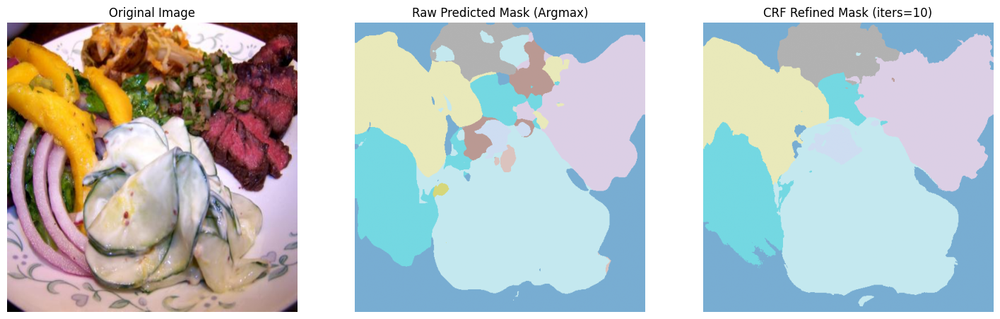

True food items:       ['shiitake', 'other ingredients', 'steak', 'cucumber', 'cilantro mint', 'onion']
Predicted food items:  ['shiitake', 'potato', 'ice cream', 'steak', 'chicken duck', 'sauce', 'carrot', 'asparagus', 'broccoli', 'cilantro mint', 'onion', 'pepper']
Food Accuracy:        28.57%
Pixel Accuracy:       43.42%
Mean IoU:             25.92%
Mean Dice:            32.34%
Avg. Hausdorff Dist.: 200.43 pixels



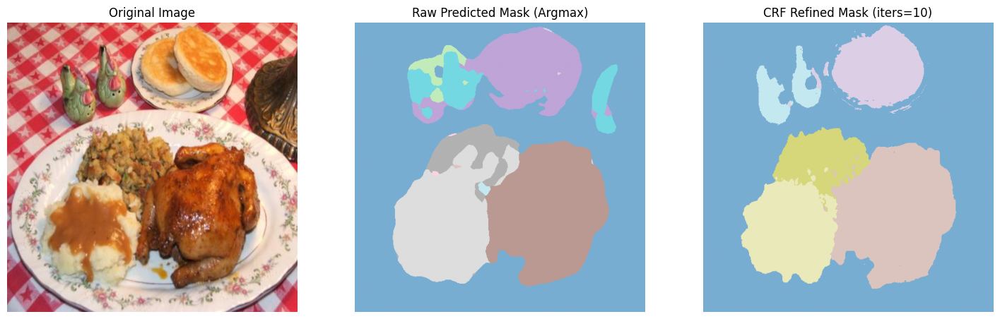

True food items:       ['chicken duck', 'pie', 'potato']
Predicted food items:  ['rice', 'lemon', 'potato', 'chicken duck', 'cucumber']
Food Accuracy:        33.33%
Pixel Accuracy:       84.14%
Mean IoU:             53.34%
Mean Dice:            59.12%
Avg. Hausdorff Dist.: 71.22 pixels



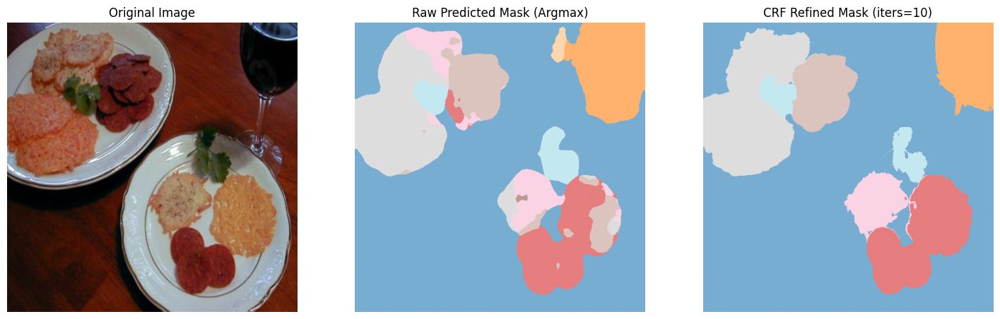

True food items:       ['wine', 'sausage', 'pie', 'cilantro mint']
Predicted food items:  ['pie', 'wine', 'sausage', 'cilantro mint', 'bread', 'strawberry', 'cherry']
Food Accuracy:        57.14%
Pixel Accuracy:       86.18%
Mean IoU:             68.21%
Mean Dice:            80.43%
Avg. Hausdorff Dist.: 184.24 pixels



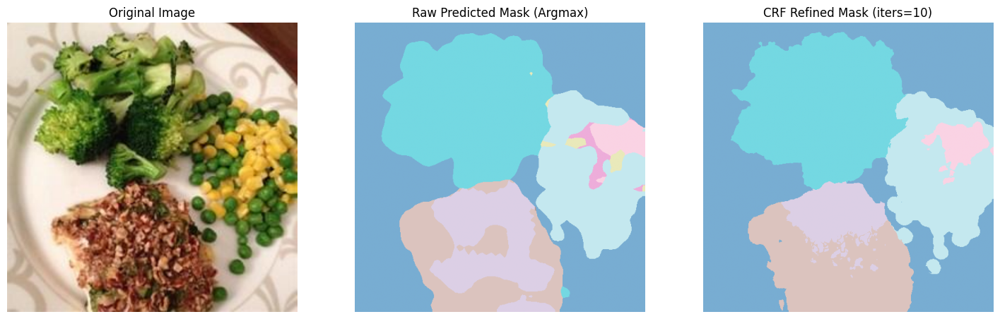

True food items:       ['corn', 'green beans', 'fish', 'broccoli']
Predicted food items:  ['pasta', 'steak', 'pork', 'fish', 'broccoli', 'green beans']
Food Accuracy:        42.86%
Pixel Accuracy:       83.65%
Mean IoU:             53.20%
Mean Dice:            61.38%
Avg. Hausdorff Dist.: 56.68 pixels



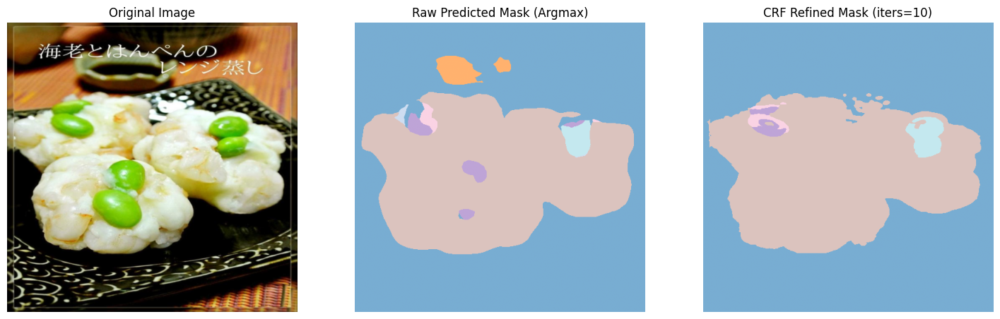

True food items:       ['shrimp', 'green beans']
Predicted food items:  ['pasta', 'grape', 'shrimp', 'green beans']
Food Accuracy:        50.00%
Pixel Accuracy:       93.48%
Mean IoU:             53.11%
Mean Dice:            63.47%
Avg. Hausdorff Dist.: 158.48 pixels



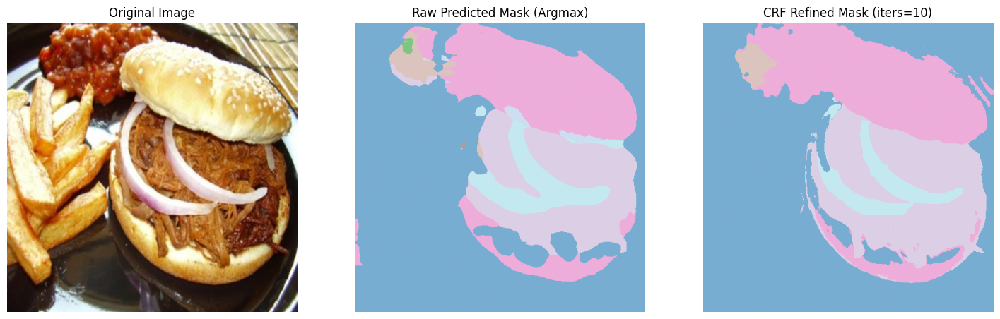

True food items:       ['french fries', 'steak', 'sauce', 'bread', 'onion']
Predicted food items:  ['french fries', 'steak', 'sauce', 'bread', 'corn', 'onion']
Food Accuracy:        83.33%
Pixel Accuracy:       86.98%
Mean IoU:             66.27%
Mean Dice:            75.74%
Avg. Hausdorff Dist.: 109.53 pixels



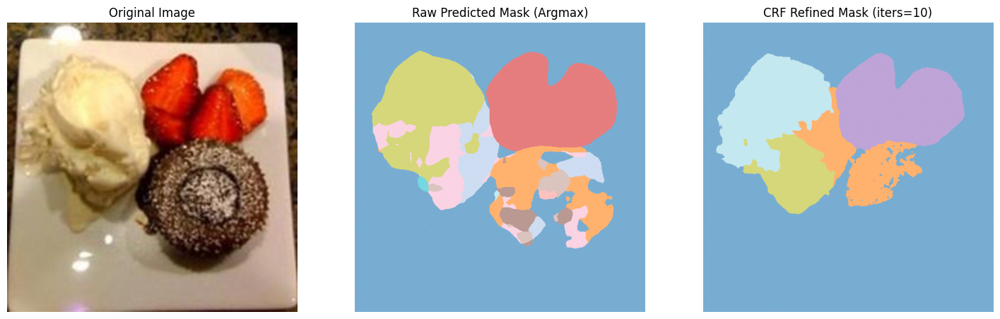

True food items:       ['ice cream', 'cake', 'strawberry']
Predicted food items:  ['potato', 'ice cream', 'cake', 'bread', 'strawberry']
Food Accuracy:        60.00%
Pixel Accuracy:       71.36%
Mean IoU:             42.45%
Mean Dice:            51.68%
Avg. Hausdorff Dist.: 95.22 pixels



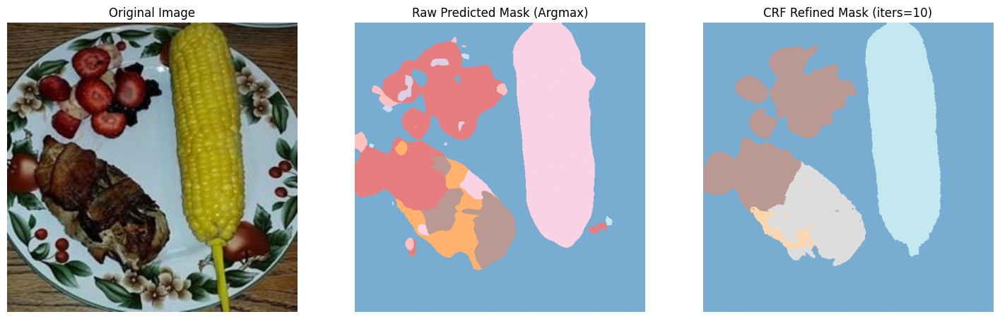

True food items:       ['raspberry', 'pork', 'chicken duck', 'corn', 'banana', 'strawberry']
Predicted food items:  ['cake', 'steak', 'corn', 'strawberry', 'cherry']
Food Accuracy:        22.22%
Pixel Accuracy:       81.78%
Mean IoU:             22.78%
Mean Dice:            26.09%
Avg. Hausdorff Dist.: 84.19 pixels



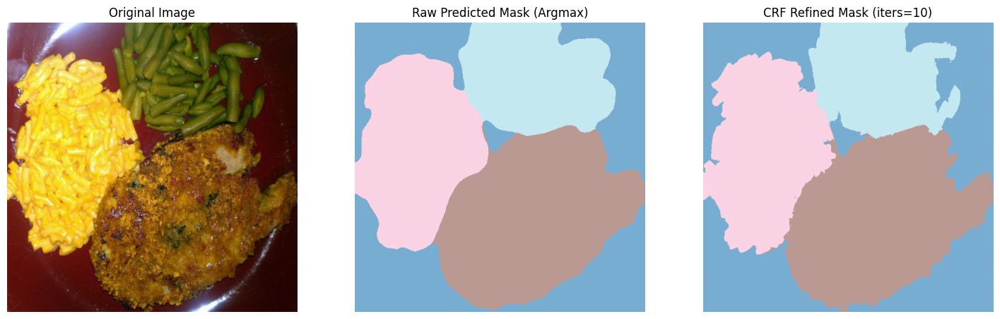

True food items:       ['pasta', 'French beans', 'pork']
Predicted food items:  ['chicken duck', 'pasta', 'French beans']
Food Accuracy:        50.00%
Pixel Accuracy:       69.17%
Mean IoU:             64.80%
Mean Dice:            65.72%
Avg. Hausdorff Dist.: 11.68 pixels



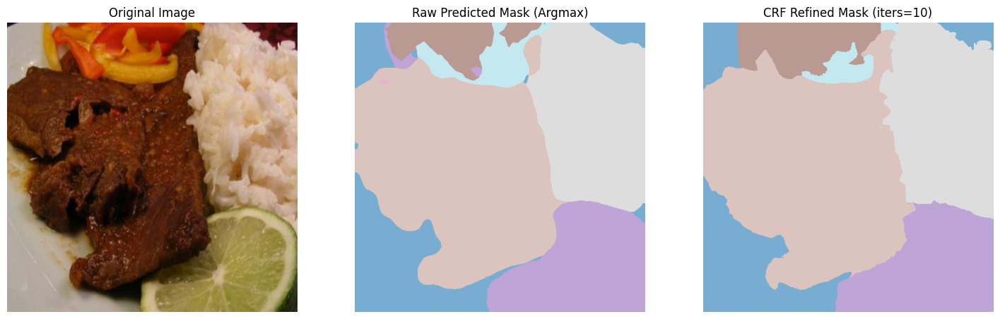

True food items:       ['chicken duck', 'rice', 'lemon', 'pepper']
Predicted food items:  ['rice', 'lemon', 'orange', 'chicken duck', 'carrot']
Food Accuracy:        50.00%
Pixel Accuracy:       88.09%
Mean IoU:             71.42%
Mean Dice:            73.16%
Avg. Hausdorff Dist.: 31.78 pixels



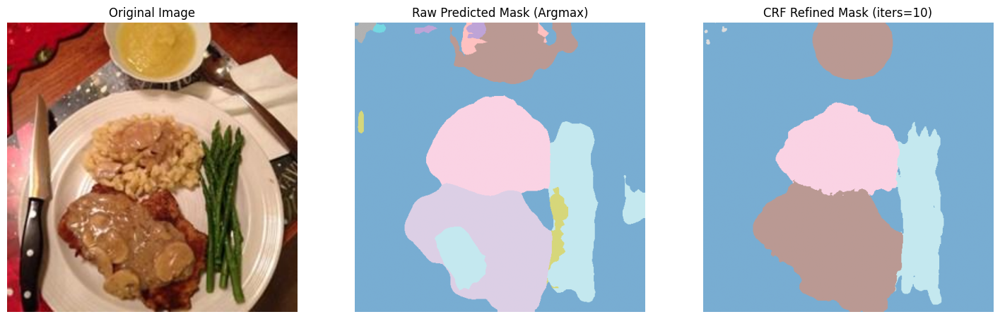

True food items:       ['white button mushroom', 'steak', 'sauce', 'asparagus', 'egg']
Predicted food items:  ['French beans', 'rice', 'tomato', 'chicken duck', 'sauce']
Food Accuracy:        11.11%
Pixel Accuracy:       66.29%
Mean IoU:             19.09%
Mean Dice:            19.54%
Avg. Hausdorff Dist.: 8.94 pixels



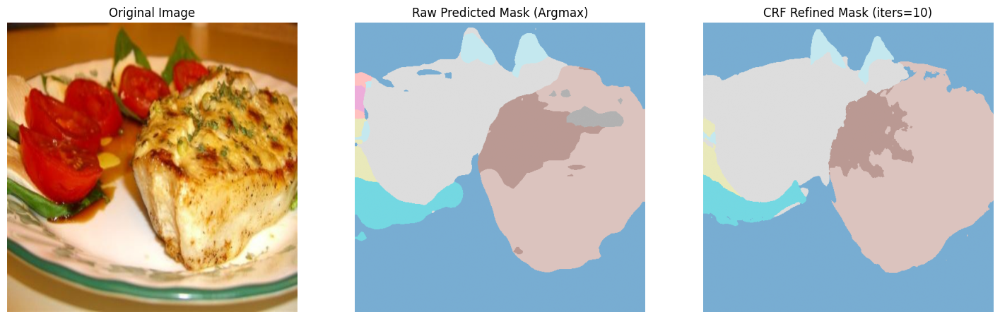

True food items:       ['tomato', 'cheese butter', 'fish', 'cilantro mint']
Predicted food items:  ['tomato', 'chicken duck', 'lettuce', 'cucumber', 'fish', 'cilantro mint', 'pepper']
Food Accuracy:        37.50%
Pixel Accuracy:       83.34%
Mean IoU:             45.65%
Mean Dice:            55.59%
Avg. Hausdorff Dist.: 142.44 pixels



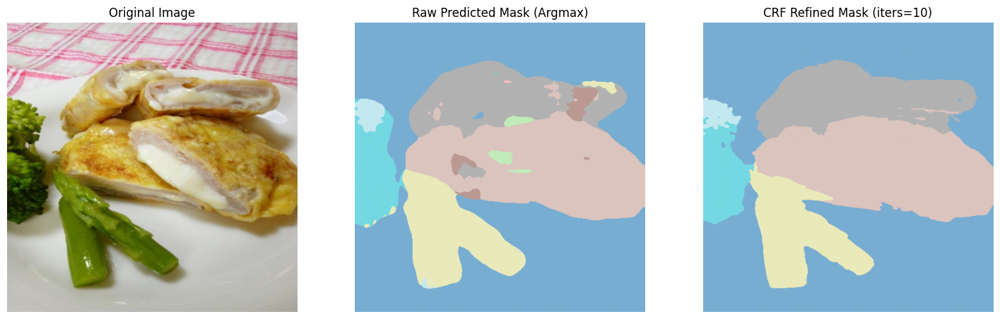

True food items:       ['chicken duck', 'asparagus', 'broccoli']
Predicted food items:  ['potato', 'asparagus', 'fish', 'broccoli', 'green beans']
Food Accuracy:        33.33%
Pixel Accuracy:       64.15%
Mean IoU:             53.32%
Mean Dice:            59.18%
Avg. Hausdorff Dist.: 37.01 pixels



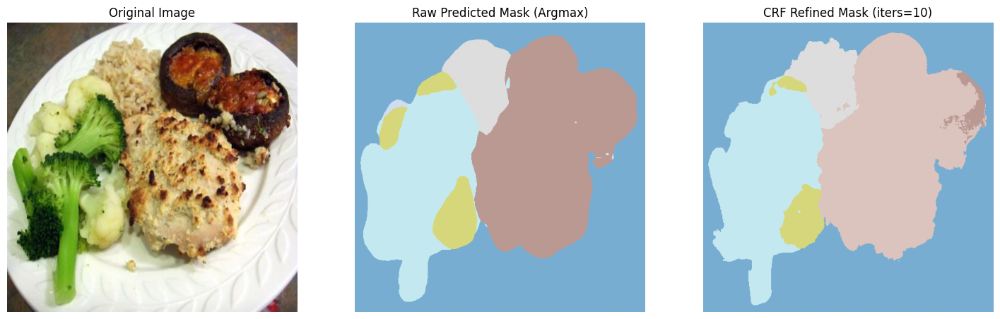

True food items:       ['rice', 'shiitake', 'cauliflower', 'chicken duck', 'broccoli']
Predicted food items:  ['rice', 'cauliflower', 'steak', 'chicken duck', 'broccoli']
Food Accuracy:        66.67%
Pixel Accuracy:       81.59%
Mean IoU:             50.15%
Mean Dice:            60.52%
Avg. Hausdorff Dist.: 89.86 pixels



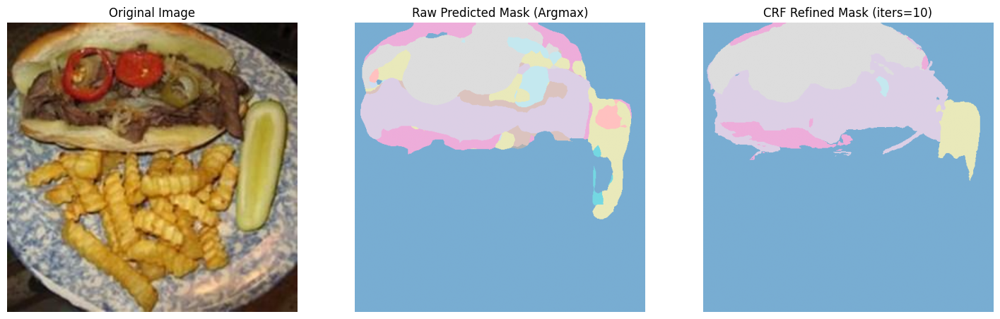

True food items:       ['french fries', 'tomato', 'steak', 'cucumber', 'bread', 'onion', 'pepper']
Predicted food items:  ['french fries', 'tomato', 'steak', 'cucumber', 'bread', 'onion']
Food Accuracy:        85.71%
Pixel Accuracy:       73.62%
Mean IoU:             28.58%
Mean Dice:            38.24%
Avg. Hausdorff Dist.: 128.13 pixels



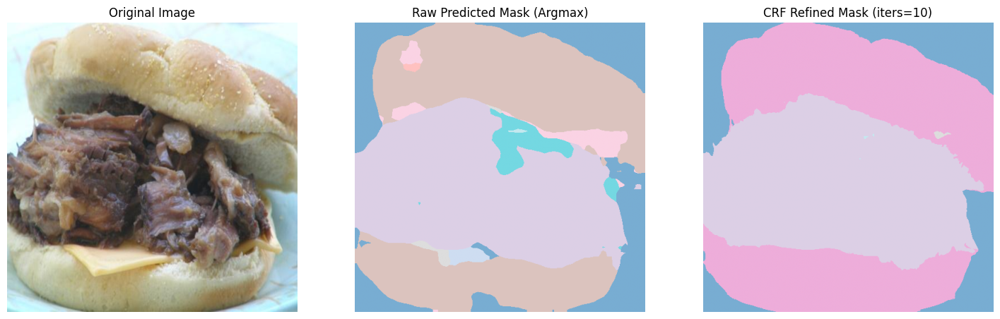

True food items:       ['cheese butter', 'bread', 'pork']
Predicted food items:  ['steak', 'bread', 'onion', 'potato']
Food Accuracy:        16.67%
Pixel Accuracy:       55.65%
Mean IoU:             29.03%
Mean Dice:            31.03%
Avg. Hausdorff Dist.: 43.93 pixels




Overall Performance Metrics:
Avg. Pixel Accuracy: 71.31%
Avg. Mean IoU:       43.33%
Avg. Mean Dice:      49.35%
Avg. Hausdorff Dist.: 108.69 pixels


In [ ]:
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from matplotlib.colors import ListedColormap
import torch.nn as nn
from pyarrow.parquet import ParquetFile
from scipy.spatial.distance import directed_hausdorff
import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import create_pairwise_gaussian, create_pairwise_bilateral, softmax_to_unary


# Updated Hyperparameters to match to training

BASE_SIZE = 513
IMG_SCALE = 1.0
IMG_SIZE = (int(round(BASE_SIZE * IMG_SCALE)), int(round(BASE_SIZE * IMG_SCALE)))
HYPERPARAMS = {
    "img_size": IMG_SIZE,
    "num_classes": 104,
    "dropout_rate": 0.3,
    "crf_iters": 10
}

# Load class mappings CSV.
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

def load_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # Load the pretrained DeepLabV3 model
    model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)


    if isinstance(model.classifier, nn.Sequential):
        classifier_layers = list(model.classifier.children())
        # Insert dropout exactly as in training
        classifier_layers.insert(-1, nn.Dropout(HYPERPARAMS["dropout_rate"]))
        classifier_layers[-1] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)
        model.classifier = nn.Sequential(*classifier_layers)
    else:
        model.classifier[4] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)

    # Load model from checkpoint
    checkpoint = torch.load("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth", map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"], strict=False)
    model.to(device)
    model.eval()
    return model, device

# Define the image transform using the updated image size.
img_transform = transforms.Compose([
    transforms.Resize(HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

def compute_segmentation_metrics(pred, target, num_classes, ignore_bg=True):
    pred, target = pred.flatten(), target.flatten()
    pixel_acc = np.mean(pred == target)

    # Identify the classes present in the ground truth
    classes_to_eval = set(np.unique(target))
    if ignore_bg:
        classes_to_eval.discard(0)
    classes_to_eval = sorted(classes_to_eval)

    # If no classes present, return perfect overlap for non-existent items.
    if not classes_to_eval:
        return pixel_acc, 1.0, 1.0

    iou_list, dice_list = [], []
    for cls in classes_to_eval:
        pred_inds, target_inds = (pred == cls), (target == cls)
        intersection = np.sum(pred_inds & target_inds)
        union = np.sum(pred_inds | target_inds)
        iou = intersection / union if union != 0 else 1.0
        dice = (2 * intersection) / (np.sum(pred_inds) + np.sum(target_inds) + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)

    return pixel_acc, np.mean(iou_list), np.mean(dice_list)


def hausdorff_distance_for_class(pred, target, cls):
    pred_points, target_points = np.argwhere(pred == cls), np.argwhere(target == cls)
    if pred_points.size == 0 or target_points.size == 0:
        return np.nan
    return max(directed_hausdorff(pred_points, target_points)[0],
               directed_hausdorff(target_points, pred_points)[0])

def compute_average_hausdorff(pred, target, num_classes):
    hd_list = [hausdorff_distance_for_class(pred, target, cls) for cls in range(1, num_classes)]
    valid_hd = [hd for hd in hd_list if not np.isnan(hd)]
    return np.nanmean(valid_hd) if valid_hd else np.nan

def stream_validation_data():
    return ParquetFile("/content/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet").iter_batches(batch_size=1)

# Method that perfroms CRF refinement on deeplab output
def crf_refine(image, probs, num_iters=10):
    H, W = image.shape[:2]
    C = probs.shape[0]

    # Convert softmax to unary (negative log probabilities)
    unary = softmax_to_unary(probs)
    unary = np.ascontiguousarray(unary)

    # Create DenseCRF
    d = dcrf.DenseCRF2D(W, H, C)
    d.setUnaryEnergy(unary)

    # Pairwise Gaussian term
    feats_gaussian = create_pairwise_gaussian(sdims=(3,3), shape=(H, W))
    d.addPairwiseEnergy(feats_gaussian, compat=6)

    # Pairwise Bilateral term
    feats_bilateral = create_pairwise_bilateral(sdims=(50,50), schan=(13,13,13),
                                                img=image, chdim=2)
    d.addPairwiseEnergy(feats_bilateral, compat=15)

    # Inference
    Q = d.inference(num_iters)
    crf_result = np.argmax(Q, axis=0).reshape((H, W))
    return crf_result

def process_image(batch, model, device, id_to_food):
   # Load image
    img = Image.open(io.BytesIO(batch['image'][0].as_py()['bytes'])).convert("RGB")
    gt_mask = np.array(
        Image.open(io.BytesIO(batch['label'][0].as_py()['bytes']))
        .resize(HYPERPARAMS["img_size"], Image.NEAREST)
    )
    true_ids = set(np.unique(gt_mask)) - {0}
    true_foods = [id_to_food.get(fid, "Unknown") for fid in true_ids if fid in id_to_food]

    # Set up Model inference
    input_tensor = img_transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        outputs = model(input_tensor)['out'][0]  # shape [C, H, W]
        raw_pred_mask = outputs.argmax(0).cpu().numpy()
        probs = torch.softmax(outputs, dim=0).cpu().numpy()

    # Run CRF refinement
    img_np = np.array(img.resize(HYPERPARAMS["img_size"], Image.BILINEAR))
    if img_np.ndim == 2:
        img_np = np.stack([img_np]*3, axis=-1)
    crf_mask = crf_refine(img_np, probs, num_iters=HYPERPARAMS["crf_iters"])

    # Compute metrics on CRF mask
    pred_ids = set(np.unique(crf_mask)) - {0}
    if not true_ids:
        food_accuracy = 100.0 if not pred_ids else 0.0
    else:
        union_ids = true_ids | pred_ids
        intersection_ids = true_ids & pred_ids
        food_accuracy = (len(intersection_ids) / len(union_ids)) * 100.0

    pixel_acc, mean_iou, mean_dice = compute_segmentation_metrics(crf_mask, gt_mask, HYPERPARAMS["num_classes"])
    avg_hausdorff = compute_average_hausdorff(crf_mask, gt_mask, HYPERPARAMS["num_classes"])

    predicted_foods = [id_to_food.get(pid, "Unknown") for pid in pred_ids if pid in id_to_food]
    return img, input_tensor, raw_pred_mask, crf_mask, gt_mask, true_foods, predicted_foods, food_accuracy, pixel_acc, mean_iou, mean_dice, avg_hausdorff

def main():
    model, device = load_model()
    val_stream = stream_validation_data()
    cmap = ListedColormap(plt.cm.tab20.colors[:HYPERPARAMS["num_classes"]])
    overall_metrics = {"pixel_acc": [], "mean_iou": [], "mean_dice": [], "hausdorff": []}

    for i, batch in enumerate(val_stream):
        (img, img_tensor, raw_mask, refined_mask, gt_mask, true_foods,
         predicted_foods, food_acc, pix_acc, mean_iou, mean_dice, hausdorff) = process_image(batch, model, device, id_to_food)
        overall_metrics["pixel_acc"].append(pix_acc)
        overall_metrics["mean_iou"].append(mean_iou)
        overall_metrics["mean_dice"].append(mean_dice)
        overall_metrics["hausdorff"].append(hausdorff)

        # Only print individual results and images for the first 25 samples.
        if i < 25:
            # Denormalize the image for display
            img_denorm = img_tensor.squeeze(0) * torch.tensor([0.229, 0.224, 0.225], device=device).view(3, 1, 1) \
                         + torch.tensor([0.485, 0.456, 0.406], device=device).view(3, 1, 1)
            img_np = np.clip(img_denorm.permute(1, 2, 0).cpu().numpy(), 0, 1)

            # Show Original Image, Raw DeepLab output, And CRF refiened output
            fig, ax = plt.subplots(1, 3, figsize=(18, 6))
            ax[0].imshow(img_np)
            ax[0].set_title("Original Image")
            ax[1].imshow(raw_mask, cmap=cmap, alpha=0.6)
            ax[1].set_title("Raw DeepLab output")
            ax[2].imshow(refined_mask, cmap=cmap, alpha=0.6)
            ax[2].set_title(f"CRF Refined Mask (iters={HYPERPARAMS['crf_iters']})")
            for a in ax:
                a.axis("off")
            plt.show()

            print("True food items:      ", true_foods)
            print("Predicted food items: ", predicted_foods)
            print(f"Food Accuracy:        {food_acc:.2f}%")
            print(f"Pixel Accuracy:       {pix_acc*100:.2f}%")
            print(f"Mean IoU:             {mean_iou*100:.2f}%")
            print(f"Mean Dice:            {mean_dice*100:.2f}%")
            print(f"Avg. Hausdorff Dist.: {hausdorff:.2f} pixels\n")

    # Compute overall performance metrics after processing all samples.
    final_pixel_acc = np.mean(overall_metrics['pixel_acc'])*100
    final_mean_iou = np.mean(overall_metrics['mean_iou'])*100
    final_mean_dice = np.mean(overall_metrics['mean_dice'])*100
    final_hausdorff = np.nanmean(overall_metrics['hausdorff'])

    print("\nOverall Performance Metrics:")
    print(f"Avg. Pixel Accuracy: {final_pixel_acc:.2f}%")
    print(f"Avg. Mean IoU:       {final_mean_iou:.2f}%")
    print(f"Avg. Mean Dice:      {final_mean_dice:.2f}%")
    print(f"Avg. Hausdorff Dist.: {final_hausdorff:.2f} pixels")


    return overall_metrics

if __name__ == "__main__":
    main()


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
<ipython-input-10-67eddf2dd5d3>:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(

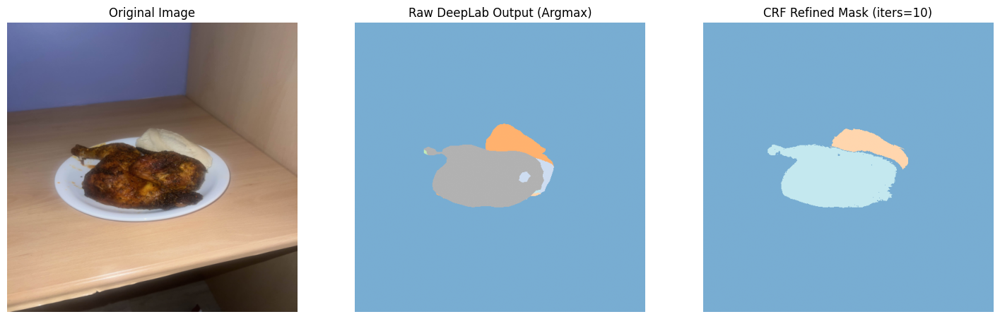

Predicted food labels: ['ice cream', 'chicken duck', 'fried meat']


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
import torch.nn as nn
import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import create_pairwise_gaussian, create_pairwise_bilateral, softmax_to_unary

# Hyperparameters
BASE_SIZE = 513
IMG_SCALE = 1.0
IMG_SIZE = (int(round(BASE_SIZE * IMG_SCALE)), int(round(BASE_SIZE * IMG_SCALE)))
HYPERPARAMS = {
    "img_size": IMG_SIZE,
    "num_classes": 104,
    "dropout_rate": 0.3,
    "crf_iters": 10
}

# Model Loading
def load_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # Load the pretrained DeepLabV3 model
    model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    if isinstance(model.classifier, nn.Sequential):
        classifier_layers = list(model.classifier.children())
        # Insert dropout exactly as in training:
        classifier_layers.insert(-1, nn.Dropout(HYPERPARAMS["dropout_rate"]))
        classifier_layers[-1] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)
        model.classifier = nn.Sequential(*classifier_layers)
    else:
        model.classifier[4] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)

    # Load only the model_state_dict from checkpoint
    checkpoint = torch.load("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth",
                              map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"], strict=False)
    model.to(device)
    model.eval()
    return model, device


# Image Transform
img_transform = transforms.Compose([
    transforms.Resize(HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


# CRF Refinement Function
def crf_refine(image, probs, num_iters=10):
    H, W = image.shape[:2]
    C = probs.shape[0]
    unary = softmax_to_unary(probs)  # shape [C, H*W]
    unary = np.ascontiguousarray(unary)
    d = dcrf.DenseCRF2D(W, H, C)
    d.setUnaryEnergy(unary)
    feats_gaussian = create_pairwise_gaussian(sdims=(3,3), shape=(H, W))
    d.addPairwiseEnergy(feats_gaussian, compat=6)
    feats_bilateral = create_pairwise_bilateral(sdims=(50,50), schan=(13,13,13),
                                                img=image, chdim=2)
    d.addPairwiseEnergy(feats_bilateral, compat=15)
    Q = d.inference(num_iters)
    crf_result = np.argmax(Q, axis=0).reshape((H, W))
    return crf_result


# Process image
def process_unlabeled_image(image_path, model, device):
    # Load image using PIL.
    img = Image.open(image_path).convert("RGB")

    # Transform image.
    input_tensor = img_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(input_tensor)['out'][0]  # shape: [C, H, W]
        raw_pred_mask = outputs.argmax(0).cpu().numpy()
        probs = torch.softmax(outputs, dim=0).cpu().numpy()  # shape: [C, H, W]

    # Prepare image for CRF
    img_np = np.array(img.resize(HYPERPARAMS["img_size"], Image.BILINEAR))
    if img_np.ndim == 2:
        img_np = np.stack([img_np]*3, axis=-1)

    # Run CRF refinement.
    crf_mask = crf_refine(img_np, probs, num_iters=HYPERPARAMS["crf_iters"])

    return img, raw_pred_mask, crf_mask, input_tensor


# Main Function
def main():
    image_path = "/content/SegTest.jpg"
    model, device = load_model()

    # Process the image.
    img, raw_mask, refined_mask, input_tensor = process_unlabeled_image(image_path, model, device)

    # Denormalize the image for display.
    img_denorm = input_tensor.squeeze(0) * torch.tensor([0.229, 0.224, 0.225], device=device).view(3,1,1) \
               + torch.tensor([0.485, 0.456, 0.406], device=device).view(3,1,1)
    img_np = np.clip(img_denorm.permute(1,2,0).cpu().numpy(), 0, 1)

   # Gets predicated food labels
    unique_labels = np.unique(refined_mask)
    unique_labels = unique_labels[unique_labels != 0]
    predicted_foods = [id_to_food.get(int(label), f"ID {label}") for label in unique_labels]

     # Display the Original Image, Raw Predicted Mask, and CRF Refined Mask.
    cmap = ListedColormap(plt.cm.tab20.colors[:HYPERPARAMS["num_classes"]])
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))
    ax[0].imshow(img_np)
    ax[0].set_title("Original Image")
    ax[1].imshow(raw_mask, cmap=cmap, alpha=0.6)
    ax[1].set_title("Raw DeepLab Output (Argmax)")
    ax[2].imshow(refined_mask, cmap=cmap, alpha=0.6)
    ax[2].set_title(f"CRF Refined Mask (iters={HYPERPARAMS['crf_iters']})")
    for a in ax:
        a.axis("off")
    plt.show()

    print("Predicted food labels:", predicted_foods)

if __name__ == "__main__":
    main()
